## Dataset CSV

In [3]:
import pandas as pd
import numpy as np
import tensorflow as tf

In [4]:
df = pd.read_csv('dataset/characters.csv')
df

,name,height,mass,hair_color,skin_color,eye_color,birth_year,gender,homeworld,species
0,Luke Skywalker,172.0,77,blond,fair,blue,19BBY,male,Tatooine,Human
1,C-3PO,167.0,75,NaN,gold,yellow,112BBY,NaN,Tatooine,Droid
2,R2-D2,96.0,32,NaN,"white, blue",red,33BBY,NaN,Naboo,Droid
3,Darth Vader,202.0,136,none,white,yellow,41.9BBY,male,Tatooine,Human
4,Leia Organa,150.0,49,brown,light,brown,19BBY,female,Alderaan,Human
...,...,...,...,...,...,...,...,...,...,...
82,Rey,NaN,NaN,brown,light,hazel,NaN,female,NaN,Human
83,Poe Dameron,NaN,NaN,brown,light,brown,NaN,male,NaN,Human
84,BB8,NaN,NaN,none,none,black,NaN,none,NaN,Droid
85,Captain Phasma,NaN,NaN,NaN,NaN,NaN,NaN,female,NaN,NaN


## Question-Answer dataset

In [5]:
df_q = pd.read_csv('dataset/question_answer.csv')
df_q

,Q: What is Luke Skywalker's height?
0,A: Luke Skywalker's height is 172.
1,Q: What is Luke Skywalker's mass?
2,A: Luke Skywalker's mass is 77.
3,Q: What is Luke Skywalker's hair color?
4,A: Luke Skywalker's hair color is blond.
...,...
232,A: Chewbacca is Wookiee.
233,Q: What is Han Solo's height?
234,A: Han Solo's height is 180.
235,Q: What is Han Solo's mass?


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87 entries, 0 to 86
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   name        87 non-null     object 
 1   height      81 non-null     float64
 2   mass        59 non-null     object 
 3   hair_color  81 non-null     object 
 4   skin_color  85 non-null     object 
 5   eye_color   84 non-null     object 
 6   birth_year  43 non-null     object 
 7   gender      84 non-null     object 
 8   homeworld   77 non-null     object 
 9   species     82 non-null     object 
dtypes: float64(1), object(9)
memory usage: 6.9+ KB


## Preprocess

In [7]:
cols = ['mass']
df = df.drop(cols, axis=1)

In [8]:
df

,name,height,hair_color,skin_color,eye_color,birth_year,gender,homeworld,species
0,Luke Skywalker,172.0,blond,fair,blue,19BBY,male,Tatooine,Human
1,C-3PO,167.0,NaN,gold,yellow,112BBY,NaN,Tatooine,Droid
2,R2-D2,96.0,NaN,"white, blue",red,33BBY,NaN,Naboo,Droid
3,Darth Vader,202.0,none,white,yellow,41.9BBY,male,Tatooine,Human
4,Leia Organa,150.0,brown,light,brown,19BBY,female,Alderaan,Human
...,...,...,...,...,...,...,...,...,...
82,Rey,NaN,brown,light,hazel,NaN,female,NaN,Human
83,Poe Dameron,NaN,brown,light,brown,NaN,male,NaN,Human
84,BB8,NaN,none,none,black,NaN,none,NaN,Droid
85,Captain Phasma,NaN,NaN,NaN,NaN,NaN,female,NaN,NaN


In [9]:
df = df.dropna() # drop all rows in the data that have missing values(Nan)

In [10]:
df

,name,height,hair_color,skin_color,eye_color,birth_year,gender,homeworld,species
0,Luke Skywalker,172.0,blond,fair,blue,19BBY,male,Tatooine,Human
3,Darth Vader,202.0,none,white,yellow,41.9BBY,male,Tatooine,Human
4,Leia Organa,150.0,brown,light,brown,19BBY,female,Alderaan,Human
5,Owen Lars,178.0,"brown, grey",light,blue,52BBY,male,Tatooine,Human
6,Beru Whitesun lars,165.0,brown,light,blue,47BBY,female,Tatooine,Human
8,Biggs Darklighter,183.0,black,light,brown,24BBY,male,Tatooine,Human
9,Obi-Wan Kenobi,182.0,"auburn, white",fair,blue-gray,57BBY,male,Stewjon,Human
10,Anakin Skywalker,188.0,blond,fair,blue,41.9BBY,male,Tatooine,Human
11,Wilhuff Tarkin,180.0,"auburn, grey",fair,blue,64BBY,male,Eriadu,Human
13,Han Solo,180.0,brown,fair,brown,29BBY,male,Corellia,Human


In [141]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34 entries, 0 to 86
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   name        34 non-null     object 
 1   height      34 non-null     float64
 2   hair_color  34 non-null     object 
 3   skin_color  34 non-null     object 
 4   eye_color   34 non-null     object 
 5   birth_year  34 non-null     object 
 6   gender      34 non-null     object 
 7   homeworld   34 non-null     object 
 8   species     34 non-null     object 
dtypes: float64(1), object(8)
memory usage: 2.7+ KB


## Data Splitting

In [11]:
import nltk
from sklearn.model_selection import train_test_split

# Assume you have a list of sentences as your corpus
corpus = ["I love NLP.", "This is a sentence.", "NLP is fun!"]

# Assume you have corresponding labels for each sentence
labels = ["positive", "neutral", "positive"]

# Split the data into train and test sets
corpus_train, corpus_test, labels_train, labels_test = train_test_split(corpus, labels, test_size=0.2, random_state=42)

# Now you have the training and testing data ready
print("Training Corpus:", corpus_train)
print("Training Labels:", labels_train)
print("Testing Corpus:", corpus_test)
print("Testing Labels:", labels_test)

Training Corpus: ['This is a sentence.', 'NLP is fun!']
Training Labels: ['neutral', 'positive']
Testing Corpus: ['I love NLP.']
Testing Labels: ['positive']


## Word2Vec

In [12]:
corpus_raw = 'He is the king . The king is royal . She is the royal  queen '
# convert to lower case
corpus_raw = corpus_raw.lower()

words = []
for word in corpus_raw.split():
    if word != '.': # because we don't want to treat . as a word
        words.append(word)

words = set(words) # so that all duplicate words are removed
word2int = {}
int2word = {}
vocab_size = len(words) # gives the total number of unique words

for i,word in enumerate(words):
    word2int[word] = i
    int2word[i] = word

In [143]:
print(word2int['queen'])
print(int2word[6])
print(word2int)
print(int2word)

5
king
{'the': 0, 'is': 1, 'he': 2, 'she': 3, 'royal': 4, 'queen': 5, 'king': 6}
{0: 'the', 1: 'is', 2: 'he', 3: 'she', 4: 'royal', 5: 'queen', 6: 'king'}


In [14]:
raw_sentences = corpus_raw.split('.')
sentences = []

for sentence in raw_sentences:
    sentences.append(sentence.split())

print(sentences)

[['he', 'is', 'the', 'king'], ['the', 'king', 'is', 'royal'], ['she', 'is', 'the', 'royal', 'queen']]


## Now, we will generate our training data:

In [149]:
data = []
WINDOW_SIZE = 2

for sentence in sentences:
    for word_index, word in enumerate(sentence):
        print(max(word_index - WINDOW_SIZE, 0), min(word_index + WINDOW_SIZE, len(sentence)) + 1)
        print(sentence[max(word_index - WINDOW_SIZE, 0) : min(word_index + WINDOW_SIZE, len(sentence)) + 1] )

        # specifies a slice that includes elements from the max_index up to (but not including) the min_index
        for nb_word in sentence[max(word_index - WINDOW_SIZE, 0) : min(word_index + WINDOW_SIZE, len(sentence)) + 1] : 
            if nb_word != word:
                data.append([word, nb_word])
                
print(data)

0 3
['he', 'is', 'the']
0 4
['he', 'is', 'the', 'king']
0 5
['he', 'is', 'the', 'king']
1 5
['is', 'the', 'king']
0 3
['the', 'king', 'is']
0 4
['the', 'king', 'is', 'royal']
0 5
['the', 'king', 'is', 'royal']
1 5
['king', 'is', 'royal']
0 3
['she', 'is', 'the']
0 4
['she', 'is', 'the', 'royal']
0 5
['she', 'is', 'the', 'royal', 'queen']
1 6
['is', 'the', 'royal', 'queen']
2 6
['the', 'royal', 'queen']
[['he', 'is'], ['he', 'the'], ['is', 'he'], ['is', 'the'], ['is', 'king'], ['the', 'he'], ['the', 'is'], ['the', 'king'], ['king', 'is'], ['king', 'the'], ['the', 'king'], ['the', 'is'], ['king', 'the'], ['king', 'is'], ['king', 'royal'], ['is', 'the'], ['is', 'king'], ['is', 'royal'], ['royal', 'king'], ['royal', 'is'], ['she', 'is'], ['she', 'the'], ['is', 'she'], ['is', 'the'], ['is', 'royal'], ['the', 'she'], ['the', 'is'], ['the', 'royal'], ['the', 'queen'], ['royal', 'is'], ['royal', 'the'], ['royal', 'queen'], ['queen', 'the'], ['queen', 'royal']]


## This basically gives a list of word, word pairs. (we are considering a window size of 2)

In [16]:
print(data)

[['he', 'is'], ['he', 'the'], ['is', 'he'], ['is', 'the'], ['is', 'king'], ['the', 'he'], ['the', 'is'], ['the', 'king'], ['king', 'is'], ['king', 'the'], ['the', 'king'], ['the', 'is'], ['king', 'the'], ['king', 'is'], ['king', 'royal'], ['is', 'the'], ['is', 'king'], ['is', 'royal'], ['royal', 'king'], ['royal', 'is'], ['she', 'is'], ['she', 'the'], ['is', 'she'], ['is', 'the'], ['is', 'royal'], ['the', 'she'], ['the', 'is'], ['the', 'royal'], ['the', 'queen'], ['royal', 'is'], ['royal', 'the'], ['royal', 'queen'], ['queen', 'the'], ['queen', 'royal']]


In [17]:
def to_one_hot(data_point_index, vocab_size):
    temp = np.zeros(vocab_size)
    temp[data_point_index] = 1
    return temp

## Convert these numbers into one hot vectors

In [153]:
x_train = [] # input word
y_train = [] # output word

for data_word in data:
    x_train.append(to_one_hot(word2int[ data_word[0] ], vocab_size))
    y_train.append(to_one_hot(word2int[ data_word[1] ], vocab_size))

# convert them to numpy arrays
x_train = np.asarray(x_train)
y_train = np.asarray(y_train)

In [19]:
print(x_train)

[[0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 0.]]


## 34 training points, where each point has 7 dimensions

In [118]:
print(x_train.shape, y_train.shape)

(34, 7) (34, 7)


## training data into the embedded representation.
    - embedding_dim is a hyperparameter

In [154]:
# making placeholders for x_train and y_train
x = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)
y_label = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)
    
EMBEDDING_DIM = 10 # you can choose your own number
W1 = tf.Variable(tf.random.normal([vocab_size, EMBEDDING_DIM]))
b1 = tf.Variable(tf.random.normal([EMBEDDING_DIM])) #bias
hidden_representation = tf.add(tf.matmul(x,W1), b1)

## we take what we have in the embedded dimension and make a prediction about the neighbour. To make the prediction we use softmaxm

In [155]:
W2 = tf.Variable(tf.random.normal([EMBEDDING_DIM, vocab_size]))
b2 = tf.Variable(tf.random.normal([vocab_size]))
prediction = tf.nn.softmax(tf.add( tf.matmul(hidden_representation, W2), b2))

# that’s left is to train it:

In [156]:
# Define the graph
graph = tf.Graph()
with graph.as_default():
    # Define the placeholders
    
    # Define the variables
    W1 = tf.Variable(tf.random.normal([vocab_size, EMBEDDING_DIM]))
    b1 = tf.Variable(tf.random.normal([EMBEDDING_DIM]))
    W2 = tf.Variable(tf.random.normal([EMBEDDING_DIM, vocab_size]))
    b2 = tf.Variable(tf.random.normal([vocab_size]))
    
    # making placeholders for x_train and y_train
    x = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)
    y_label = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)

    # Define the operations
    hidden_representation = tf.add(tf.matmul(x, W1), b1)
    prediction = tf.nn.softmax(tf.add(tf.matmul(hidden_representation, W2), b2))
    
    # Initialize the variables
    init = tf.compat.v1.global_variables_initializer()

# Create a TensorFlow session and run the initialization
with tf.compat.v1.Session(graph=graph) as sess:
    sess.run(init)
    cross_entropy_loss = tf.reduce_mean(-tf.reduce_sum(y_label * tf.math.log(prediction), axis=1))

    # Define the training step
    optimizer = tf.compat.v1.train.GradientDescentOptimizer(0.1)
    train_step = optimizer.minimize(cross_entropy_loss)

    n_iters = 10000
    for _ in range(n_iters):
        feed_dict = {x: x_train, y_label: y_train}
        sess.run(train_step, feed_dict=feed_dict)

        # Display of loss
        print('loss is : ', sess.run(cross_entropy_loss, feed_dict={x: x_train, y_label: y_train}))
        
        # Hidden representations.
        print(sess.run(W1))
        print('----------')
        print(sess.run(b1))
        print('----------')

loss is :  4.69339
[[ 0.26914755 -0.66325766 -0.76730156 -0.45320925 -0.74823177 -1.1503644
  -0.3520402  -0.9206169   0.5744187  -0.8285123 ]
 [-0.7485529   0.06104865  0.8891158   1.0535755  -0.9578514   1.5052675
  -0.01123105  1.287356   -0.07749909 -0.41903454]
 [-0.6624155  -0.5108845  -1.3972011  -2.3923447  -0.843368    0.22631627
   0.46777934 -0.18351941  0.7008676  -1.3276218 ]
 [-0.9065623  -1.044213   -0.28871545 -0.37499344 -0.2712997  -0.45709243
  -1.2704166   0.7620483  -0.11709639 -0.19239528]
 [ 0.2727427  -0.79107577  1.7718328   0.6544726   0.0618846   1.7578304
   0.97989285 -0.62134016  1.2489778   1.364215  ]
 [ 0.24199326 -1.0625      0.88919705 -0.15569952  0.57801694  2.027112
  -0.14330551 -0.91958845 -1.6578519   1.3698087 ]
 [-0.25493813  0.12206727  1.0780036   0.22438887  0.2674404   0.36349022
   1.0392238  -1.089722    0.5446206   1.5141668 ]]
----------
[ 0.07435656 -0.3931193  -0.56307954 -0.13456711 -0.47911966 -1.1406316
  0.09295193 -1.2400275   1

loss is :  1.5107793
[[ 0.14233872 -0.6411085  -0.47126588 -0.7973626  -0.864562   -0.900745
  -0.29022193 -0.339269    0.68359375 -0.7656228 ]
 [-0.6687113  -0.34792143  0.7790211   1.4012016  -1.2038311   0.8128112
   0.02578923  0.668819   -0.61787534  0.03156536]
 [ 0.00763128 -0.4009849  -1.1968303  -2.1659944  -1.0000604   0.2725821
   0.19400063 -0.4769326   0.3218119  -1.1740396 ]
 [-0.4594309  -0.6634993  -0.31380615 -0.31173125 -0.3623183  -0.11253902
  -1.3390002   0.557745   -0.14624007 -0.11047336]
 [-0.32306993 -0.6132845   1.6353414   0.5227029   0.192569    1.5202843
   0.69520795 -0.73976415  1.5799112   1.5199939 ]
 [ 0.2227687  -1.1713971   0.8465853  -0.19886431  0.71680164  2.3690252
   0.23959763 -0.48162475 -1.4725721   0.89030117]
 [-0.09625515  0.15791674  1.1833589   0.07245823  0.483203    0.9396538
   1.2533435  -0.42578265  0.65414387  0.93354744]]
----------
[ 0.68821394 -0.18458378 -0.27560627 -0.1683459  -0.6039098  -0.512119
  0.1617662  -0.79145443  1.

[ 0.78102446 -0.1346266  -0.2843978  -0.16242065 -0.5618407  -0.41190466
  0.1601733  -0.8121342   1.4738533  -0.59669846]
----------
loss is :  1.4152176
[[ 0.03209509 -0.7929423  -0.45446515 -0.73572934 -0.97363275 -0.9771696
  -0.14691116 -0.21698251  0.72933346 -0.79718655]
 [-0.68491226 -0.45735     0.84397477  1.4015509  -1.2413677   0.70784336
   0.02638731  0.73500806 -0.7511919   0.06592814]
 [ 0.09981936 -0.26791722 -1.158516   -2.1905475  -1.0148329   0.2505882
   0.00068031 -0.6205692   0.27018225 -1.0406181 ]
 [-0.34740958 -0.53342444 -0.41206312 -0.3221455  -0.24843302  0.07426465
  -1.31592     0.4686373  -0.06713168 -0.20683494]
 [-0.42881113 -0.53758925  1.6548553   0.47035897  0.15151252  1.4391245
   0.5776266  -0.77914315  1.6156296   1.665148  ]
 [ 0.2527812  -1.2319814   0.8272191  -0.17038257  0.7530773   2.4577124
   0.3639027  -0.3990865  -1.428907    0.74385935]
 [-0.00474957  0.1913734   1.1524943   0.07510234  0.5780077   1.0498182
   1.271276   -0.44552568 

loss is :  1.378292
[[-0.01888103 -0.8922332  -0.44323877 -0.6650389  -1.0446796  -1.0613933
  -0.07244558 -0.17009482  0.7794126  -0.8289841 ]
 [-0.7084521  -0.5090683   0.87794876  1.3951793  -1.2644745   0.64860153
   0.02811398  0.77388155 -0.83370477  0.09865373]
 [ 0.1325264  -0.1830567  -1.1382996  -2.2338674  -1.0147367   0.27022412
  -0.09431072 -0.67035764  0.24447313 -0.96820986]
 [-0.27605712 -0.45355603 -0.4694508  -0.34877756 -0.15869793  0.20551689
  -1.315714    0.41883296 -0.03785706 -0.26368245]
 [-0.4863476  -0.5033537   1.6648296   0.45125726  0.12225147  1.3903087
   0.5238005  -0.80147886  1.6378094   1.7390918 ]
 [ 0.27465823 -1.2666354   0.82150763 -0.15432012  0.76655215  2.489566
   0.41868144 -0.36087346 -1.4172587   0.67874444]
 [ 0.05114245  0.21491277  1.1315397   0.06799658  0.633865    1.1261901
   1.2804374  -0.45789918  0.6679089   0.771856  ]]
----------
[ 0.83153206 -0.09729555 -0.29317373 -0.17832778 -0.52563024 -0.3441779
  0.15161245 -0.8226337   

loss is :  1.3573376
[[-0.05176363 -0.9706047  -0.43725812 -0.5979749  -1.0921321  -1.1420289
  -0.01678081 -0.15247203  0.8289107  -0.8575271 ]
 [-0.73062736 -0.54374886  0.9018622   1.3894027  -1.2831738   0.6075643
   0.0304483   0.80305815 -0.89941454  0.12723942]
 [ 0.14899305 -0.11787459 -1.125949   -2.2767155  -1.0097603   0.3024901
  -0.15697291 -0.6907683   0.22821863 -0.922653  ]
 [-0.22446668 -0.3866286  -0.50609386 -0.3813186  -0.09421623  0.30625007
  -1.3338021   0.38320354 -0.02783439 -0.29224336]
 [-0.5294177  -0.48083678  1.6714116   0.44132712  0.09951863  1.3518021
   0.48739934 -0.81957126  1.6556728   1.7912914 ]
 [ 0.29394838 -1.2970686   0.81918913 -0.14029546  0.7745148   2.50751
   0.4610117  -0.3317705  -1.4126139   0.6315406 ]
 [ 0.09606861  0.2326072   1.1157922   0.05895752  0.67336714  1.1885421
   1.2872216  -0.46351025  0.66296107  0.73279995]]
----------
[ 0.8656774  -0.06846026 -0.29905593 -0.19737278 -0.4975928  -0.29106307
  0.14157446 -0.82647496  1

loss is :  1.3463477
[[-0.07214341 -1.0260116  -0.4351704  -0.5471396  -1.1189593  -1.203181
   0.02253976 -0.14874883  0.8671748  -0.8792559 ]
 [-0.7460138  -0.56631064  0.918294    1.385976   -1.297412    0.5816554
   0.03217343  0.8234136  -0.94723     0.14783052]
 [ 0.15754972 -0.07305507 -1.119234   -2.308771   -1.0050197   0.33084023
  -0.1970097  -0.6990751   0.21849602 -0.8955474 ]
 [-0.19262156 -0.33700213 -0.5276768  -0.409376   -0.05419455  0.37418592
  -1.355343    0.36054087 -0.02517422 -0.3039158 ]
 [-0.5593758  -0.46561477  1.6754506   0.43553823  0.08417863  1.3252085
   0.46310464 -0.8326979   1.6687926   1.8262799 ]
 [ 0.3089899  -1.3200368   0.81942654 -0.13018627  0.7785315   2.5175173
   0.49124074 -0.31052494 -1.4116677   0.6000634 ]
 [ 0.1282588   0.24339654  1.1047678   0.05201801  0.69936264  1.2327025
   1.2931242  -0.46513787  0.6579527   0.70513487]]
----------
[ 0.8875865  -0.04894028 -0.3021529  -0.2126962  -0.47922552 -0.25426456
  0.13287905 -0.82687443 

[ 0.9036718  -0.03452722 -0.3038848  -0.2249558  -0.466075   -0.22642829
  0.12537879 -0.8261112   1.458397   -0.6596294 ]
----------
loss is :  1.3396865
[[-0.08724706 -1.0692694  -0.43468124 -0.50647557 -1.1360391  -1.2525702
   0.05343846 -0.14974785  0.8981609  -0.89674246]
 [-0.75674075 -0.5834474   0.931457    1.3841461  -1.3095921   0.5631089
   0.03352111  0.83946687 -0.9859709   0.16376689]
 [ 0.16311432 -0.03876521 -1.1149976  -2.3340924  -1.0011036   0.35498488
  -0.22667046 -0.70336115  0.21165119 -0.8766067 ]
 [-0.17073087 -0.29724216 -0.5429979  -0.43321714 -0.0256922   0.42524618
  -1.3760633   0.34382105 -0.02421683 -0.3094209 ]
 [-0.583016   -0.4533082   1.6782484   0.43110994  0.07262224  1.3048987
   0.4440651  -0.84333086  1.6795839   1.8532933 ]
 [ 0.3217362  -1.338413    0.8211217  -0.12258377  0.78047544  2.524329
   0.51494485 -0.29307565 -1.4124345   0.5768051 ]
 [ 0.15377863  0.25037146  1.0959618   0.04678271  0.71910036  1.2670577
   1.2990125  -0.46522734  

[ 0.9160243  -0.02366182 -0.30481988 -0.2346234  -0.4564284  -0.2049369
  0.11907247 -0.82496357  1.4510764  -0.6646416 ]
----------
loss is :  1.3355318
[[-0.09881903 -1.1027673  -0.43488902 -0.4747212  -1.1471425  -1.2916535
   0.07752819 -0.15234873  0.9225925  -0.91043764]
 [-0.7638345  -0.59675485  0.9421388   1.3834476  -1.3198858   0.54964334
   0.0345993   0.85214084 -1.0171541   0.17592096]
 [ 0.1669537  -0.01257726 -1.1122391  -2.353732   -0.99806035  0.37456504
  -0.24897042 -0.70575655  0.20669876 -0.8629963 ]
 [-0.15551482 -0.26601806 -0.5544277  -0.4524296  -0.00485853  0.46367407
  -1.393956    0.33113155 -0.02360475 -0.31216702]
 [-0.60178316 -0.4431614   1.6801777   0.42750573  0.06386755  1.2893887
   0.4288564  -0.85195285  1.6884494   1.8744276 ]
 [ 0.33233723 -1.3527564   0.8235342  -0.11702453  0.78112566  2.5292668
   0.5333419  -0.2788037  -1.41405     0.5596594 ]
 [ 0.17387521  0.25479573  1.08889     0.04298107  0.7343397   1.2936052
   1.3045533  -0.464715   

[ 0.926047   -0.01509773 -0.30528507 -0.24246395 -0.44902006 -0.18761992
  0.11368248 -0.8237051   1.4443978  -0.6685738 ]
----------
loss is :  1.332712
[[-0.10831191 -1.1300646  -0.4353885  -0.4487897  -1.1549476  -1.323989
   0.09728095 -0.15540636  0.94270617 -0.9216431 ]
 [-0.7686647  -0.60778815  0.95129555  1.383442   -1.328929    0.53916854
   0.03552579  0.86269087 -1.0435032   0.18567576]
 [ 0.16984412  0.0085624  -1.1102974  -2.369723   -0.9955962   0.390979
  -0.26682585 -0.7072672   0.20285782 -0.852473  ]
 [-0.1441571  -0.24037516 -0.56365985 -0.46840918  0.01151773  0.49432665
  -1.4095079   0.32081828 -0.02298769 -0.31371012]
 [-0.6175405  -0.43432415  1.6815752   0.4243618   0.0568198   1.2768366
   0.4159568  -0.85933095  1.6961105   1.8919886 ]
 [ 0.34152535 -1.364473    0.8262989  -0.11275784  0.7810372   2.533211
   0.54837793 -0.26655078 -1.4160966   0.5462497 ]
 [ 0.19052017  0.25776508  1.0829      0.04008006  0.74687105  1.3152342
   1.3097638  -0.4639992   0.6

loss is :  1.3304577
[[-0.11741254 -1.1558781  -0.43610585 -0.4242809  -1.1613882  -1.3549387
   0.11607294 -0.15892659  0.96185994 -0.9322584 ]
 [-0.7723684  -0.61848325  0.96041036  1.3839662  -1.3380767   0.5296157
   0.03645875  0.8728865  -1.0693101   0.1947689 ]
 [ 0.1724081   0.02841057 -1.1086996  -2.3848197  -0.9932812   0.40682152
  -0.2835118  -0.7084188   0.19937807 -0.84292793]
 [-0.13420856 -0.21601105 -0.5724224  -0.4837069   0.02661801  0.522803
  -1.424886    0.31102043 -0.0222087  -0.31475222]
 [-0.6329338  -0.42539167  1.6827335   0.4211656   0.05019708  1.2649953
   0.40320957 -0.86667335  1.7037957   1.909002  ]
 [ 0.35072502 -1.3755646   0.82962865 -0.10896093  0.7804025   2.5369673
   0.56266224 -0.25435725 -1.4186851   0.5340197 ]
 [ 0.20651403  0.2600682   1.0770072   0.03750316  0.7589038   1.3357118
   1.3152838  -0.46313202  0.6446768   0.63333386]]
----------
[ 0.9356674  -0.00715595 -0.30546096 -0.24988928 -0.44233814 -0.17121916
  0.10833818 -0.8222452   

loss is :  1.328704
[[-0.12589474 -1.1795286  -0.43695453 -0.40187    -1.1665465  -1.3835902
   0.13339442 -0.1625918   0.9795025  -0.94199556]
 [-0.7749876  -0.6285751   0.9691996   1.3849415  -1.3470005   0.52112055
   0.03737288  0.88243365 -1.0937926   0.20298798]
 [ 0.1746253   0.04649021 -1.1074307  -2.398625   -0.99116915  0.421575
  -0.29866812 -0.70929396  0.19631942 -0.8344897 ]
 [-0.12571469 -0.19362243 -0.5805318  -0.4978374   0.04018959  0.54848254
  -1.4394644   0.30197102 -0.02127527 -0.31544518]
 [-0.64753073 -0.4166467   1.6836408   0.41801336  0.04414148  1.2541378
   0.39097458 -0.87376636  1.7112689   1.9250245 ]
 [ 0.35963172 -1.3857384   0.83332634 -0.1056921   0.7793255   2.5404963
   0.5758323  -0.2426024  -1.4216535   0.52318263]
 [ 0.22140527  0.26177537  1.071384    0.03527645  0.77014536  1.354518
   1.3208477  -0.46221676  0.6423366   0.6186861 ]]
----------
[ 0.9444782  -0.00015184 -0.30537894 -0.25654903 -0.43662754 -0.15645558
  0.10333843 -0.8207107   1

loss is :  1.3274484
[[-0.13306534 -1.1991812  -0.43778923 -0.38329777 -1.1703274  -1.4075965
   0.14786576 -0.16590184  0.99421936 -0.9500954 ]
 [-0.77658933 -0.6372121   0.9768456   1.3861369  -1.3548238   0.51422244
   0.03818097  0.89052254 -1.1147869   0.20973794]
 [ 0.17637686  0.06144476 -1.1065155  -2.4100728  -0.98941636  0.4339865
  -0.3111863  -0.7099224   0.19387409 -0.8276796 ]
 [-0.11907402 -0.17499098 -0.58735335 -0.5096387   0.05130821  0.569532
  -1.4518825   0.29438525 -0.02031449 -0.31588057]
 [-0.660057   -0.40893385  1.6842749   0.415214    0.0391022   1.2450899
   0.38035622 -0.8799571   1.7178276   1.938704  ]
 [ 0.36740455 -1.3942027   0.83689076 -0.10312945  0.77805716  2.5435324
   0.5868538  -0.23237363 -1.4245771   0.51443297]
 [ 0.23396277  0.26292455  1.0665305   0.03351437  0.7796791   1.3701925
   1.3258344  -0.46139485  0.6404599   0.6060936 ]]
----------
[ 0.9519024   0.00554161 -0.30512878 -0.26203027 -0.43213508 -0.14423661
  0.09907214 -0.8192867   

[[-0.13870429 -1.2144102  -0.43851227 -0.36894602 -1.1729597  -1.4263146
   0.1591287  -0.16860563  1.0056534  -0.95637906]
 [-0.77747107 -0.6440774   0.9829919   1.3873153  -1.3611453   0.50896627
   0.03883941  0.8968872  -1.1314789   0.21492009]
 [ 0.17767921  0.07299327 -1.1058911  -2.418928   -0.9880571   0.4436885
  -0.3208472  -0.7103625   0.19204082 -0.82251877]
 [-0.11417136 -0.16054668 -0.59269935 -0.51881033  0.0598381   0.5856667
  -1.46167     0.28846234 -0.01944464 -0.31615186]
 [-0.6700269  -0.4026628   1.6846887   0.41292474  0.03518366  1.238054
   0.371826   -0.8849528   1.7231435   1.9495547 ]
 [ 0.37367028 -1.4007705   0.8399683  -0.10123883  0.7768362   2.5459697
   0.5954514  -0.22414388 -1.427138    0.5078056 ]
 [ 0.2438124   0.26366144  1.0626478   0.03219715  0.7872035   1.3823749
   1.3299202  -0.46073312  0.6390571   0.5960693 ]]
----------
[ 0.95773244  0.0098805  -0.30481872 -0.26624295 -0.4288144  -0.13479103
  0.09569807 -0.81809276  1.4197613  -0.6801138

[[-0.14361615 -1.2275121  -0.43918502 -0.3566296  -1.1750249  -1.4424951
   0.16885309 -0.17101485  1.0155077  -0.96179146]
 [-0.7779808  -0.6501118   0.98843634  1.3885111  -1.3667655   0.5045
   0.03942874  0.90242887 -1.1461431   0.21934581]
 [ 0.17876193  0.08290299 -1.1054121  -2.426535   -0.9868856   0.45208925
  -0.32913542 -0.71071607  0.19050764 -0.8181548 ]
 [-0.11011369 -0.14812022 -0.5973433  -0.5267149   0.06712285  0.59942627
  -1.4701942   0.2833343  -0.01860448 -0.3163494 ]
 [-0.6787944  -0.3970549   1.6849887   0.41086793  0.03179763  1.2319788
   0.36426732 -0.88939494  1.7278883   1.9590751 ]
 [ 0.3792353  -1.4064285   0.8428402  -0.09967771  0.77561843  2.5481362
   0.60289246 -0.21684434 -1.4295529   0.50220704]
 [ 0.25237173  0.26419723  1.0592179   0.03109278  0.7937805   1.3928854
   1.3335856  -0.4601537   0.6378911   0.5872579 ]]
----------
[ 0.9628083   0.01356618 -0.30446994 -0.26984254 -0.42607078 -0.12667637
  0.09274834 -0.81700516  1.4154226  -0.6818235 

loss is :  1.3254443
[[-0.1474883  -1.2377359  -0.43974137 -0.34704095 -1.1765131  -1.4551678
   0.17646249 -0.17294201  1.0232067  -0.9660197 ]
 [-0.77822053 -0.6549052   0.9927857   1.3895638  -1.3712677   0.50104743
   0.03990341  0.9067937  -1.1577827   0.22277892]
 [ 0.1795828   0.09061944 -1.1050751  -2.432462   -0.9859694   0.4586759
  -0.3355893  -0.7109791   0.18934026 -0.8147964 ]
 [-0.10704583 -0.13842694 -0.6009972  -0.5328898   0.07277492  0.6100847
  -1.4769039   0.27931216 -0.01788839 -0.3164851 ]
 [-0.68575966 -0.39253962  1.6851867   0.40920556  0.02914314  1.2272221
   0.35822463 -0.8929561   1.7317044   1.9666282 ]
 [ 0.38369167 -1.4108481   0.8452263  -0.09850082  0.77456003  2.5498765
   0.60872895 -0.21100505 -1.4315752   0.4979029 ]
 [ 0.25910652  0.26455712  1.0564823   0.03024692  0.7989829   1.4011074
   1.3365405  -0.45969835  0.63700986  0.58026206]]
----------
[ 0.966811    0.01641395 -0.30414528 -0.27263495 -0.4240028  -0.12034992
  0.09041729 -0.8161188  

loss is :  1.324952
[[-0.15186906 -1.2491913  -0.4403967  -0.33632076 -1.1780555  -1.469415
   0.18501118 -0.17514518  1.0318416  -0.9707631 ]
 [-0.7783274  -0.66036785  0.9977635   1.3908669  -1.3764325   0.49721107
   0.04045082  0.91172546 -1.1710321   0.22660474]
 [ 0.18047781  0.09924961 -1.1047357  -2.439094   -0.98494035  0.4660868
  -0.34280854 -0.7112639   0.18806285 -0.8110793 ]
 [-0.10370634 -0.12757118 -0.6051228  -0.53981394  0.07907636  0.621947
  -1.4844785   0.27478427 -0.01702195 -0.3166217 ]
 [-0.69369495 -0.38733363  1.6853714   0.40728226  0.02615327  1.2218742
   0.35130122 -0.8970464   1.736101    1.9752245 ]
 [ 0.3888049  -1.4158058   0.8480519  -0.09722441  0.7732621   2.5518825
   0.6153014  -0.20431103 -1.4339868   0.49314553]
 [ 0.2667119   0.2649051   1.053353    0.02931269  0.8048883   1.4103447
   1.3399466  -0.45918813  0.6360546   0.57229877]]
----------
[ 0.9713414   0.01957828 -0.30372778 -0.27574682 -0.42176193 -0.11326496
  0.08777477 -0.81508946  1.

loss is :  1.3245445
[[-0.1558477  -1.2594949  -0.4410138  -0.3267007  -1.1793334  -1.4822712
   0.19272047 -0.1771619   1.0396144  -0.9750361 ]
 [-0.77828014 -0.6653643   1.0023344   1.3921547  -1.3811862   0.493787
   0.04095644  0.91619605 -1.1831386   0.23002769]
 [ 0.1812607   0.10699815 -1.1044643  -2.4450512  -0.98401177  0.47277823
  -0.34929174 -0.71151304  0.18694179 -0.80777615]
 [-0.1007876  -0.11781345 -0.6088624  -0.54604524  0.08471701  0.6325443
  -1.491338    0.27069294 -0.01618414 -0.3167332 ]
 [-0.70095056 -0.38251776  1.6855035   0.40549678  0.02344766  1.2170466
   0.34493497 -0.9008167   1.7401662   1.983079  ]
 [ 0.3935132  -1.4202697   0.85073096 -0.09611364  0.77199405  2.5537412
   0.621244   -0.19815278 -1.4362879   0.48892403]
 [ 0.2736065   0.26517206  1.0504797   0.02848224  0.8102714   1.4186766
   1.3430941  -0.45873135  0.63522565  0.5650237 ]]
----------
[ 0.975459    0.02240236 -0.30330405 -0.27853057 -0.41981468 -0.10689361
  0.08537044 -0.8141315   

loss is :  1.3242062
[[-0.15944582 -1.2687347  -0.44158876 -0.31809402 -1.1803937  -1.4938307
   0.199648   -0.1789953   1.0465876  -0.9788726 ]
 [-0.7781245  -0.6699116   1.0065066   1.3934058  -1.3855343   0.49073762
   0.04142031  0.9202309  -1.1941427   0.23308253]
 [ 0.18194494  0.11393438 -1.104248   -2.4503853  -0.98317647  0.4787968
  -0.35509717 -0.7117327   0.18595965 -0.8048457 ]
 [-0.0982366  -0.10907146 -0.612238   -0.55163413  0.08975323  0.6419873
  -1.4975221   0.26701033 -0.01538558 -0.31682605]
 [-0.7075509  -0.3780923   1.6855953   0.40385106  0.02100674  1.2127029
   0.339115   -0.90427065  1.7439015   1.9902219 ]
 [ 0.39782277 -1.4242766   0.8532436  -0.0951471   0.7707771   2.5554547
   0.6265969  -0.1925207  -1.4384576   0.48518428]
 [ 0.27983204  0.26537785  1.0478551   0.02774356  0.8151568   1.4261672
   1.3459818  -0.45832518  0.634508    0.5584107 ]]
----------
[ 0.9791862   0.02491843 -0.3028867  -0.28101435 -0.41812375 -0.10118081
  0.08319305 -0.8132485  

[ 0.9826954   0.02725397 -0.30246544 -0.2833219  -0.41659212 -0.09584878
  0.08114266 -0.81240517  1.3977032  -0.68812543]
----------
loss is :  1.323909
[[-0.16286686 -1.2774509  -0.44214955 -0.30999166 -1.1813211  -1.504762
   0.20619582 -0.18074451  1.0531685  -0.98249686]
 [-0.7778821  -0.67426026  1.0105051   1.394667   -1.3897091   0.48787746
   0.04186692  0.92405826 -1.2046533   0.23595196]
 [ 0.18257506  0.12046792 -1.1040674  -2.4554121  -0.98238605  0.48448962
  -0.36056727 -0.71193784  0.18505332 -0.80210775]
 [-0.09588528 -0.10083205 -0.61544204 -0.5569068   0.09448586  0.6508446
  -1.5033827   0.2635247  -0.01459127 -0.31690866]
 [-0.71385884 -0.37382486  1.685659    0.40225983  0.01868998  1.2085923
   0.33352813 -0.90759236  1.7475039   1.9970473 ]
 [ 0.4019642  -1.4280595   0.8557092  -0.09426033  0.7695605   2.557113
   0.6316683  -0.18711233 -1.4405968   0.4816951 ]
 [ 0.28574288  0.26554564  1.0453366   0.02705022  0.819817    1.4332508
   1.348761   -0.45794648  0.

loss is :  1.3236544
[[-0.16602464 -1.2854388  -0.4426787  -0.30258146 -1.1821104  -1.5148015
   0.21220681 -0.18236242  1.0592004  -0.9858226 ]
 [-0.77757984 -0.67829525  1.0142215   1.3958937  -1.3935964   0.48527026
   0.04228332  0.92758214 -1.2143948   0.23857135]
 [ 0.18313946  0.12644704 -1.1039212  -2.4600124  -0.98165935  0.48971835
  -0.36557502 -0.71212465  0.18424007 -0.7996204 ]
 [-0.09377609 -0.09328867 -0.6183941  -0.5617386   0.09880752  0.65891784
  -1.5087742   0.26032084 -0.01382843 -0.31698105]
 [-0.71970814 -0.36983562  1.6856982   0.40076855  0.01655377  1.2048137
   0.32832676 -0.91069     1.7508727   2.0033777 ]
 [ 0.4058241  -1.4315281   0.8580497  -0.09346862  0.76838785  2.5586703
   0.63633406 -0.18207535 -1.4426359   0.47852996]
 [ 0.29119205  0.26567885  1.0429926   0.02641657  0.82413274  1.4397584
   1.3513532  -0.45760396  0.6332749   0.54624474]]
----------
[ 0.9860112   0.0294327  -0.30204377 -0.28547502 -0.41519734 -0.09085076
  0.07920542 -0.8115992

[ 0.9891544   0.03147412 -0.30162433 -0.28749228 -0.4139209  -0.08614799
  0.07736959 -0.8108282   1.3917552  -0.69003814]
----------
loss is :  1.3234248
[[-0.16908188 -1.2931199  -0.44320118 -0.2954694  -1.1828157  -1.5244749
   0.21799625 -0.18393043  1.0650012  -0.98902506]
 [-0.7772188  -0.68222034  1.0178415   1.3971366  -1.3973892   0.48277456
   0.0426899   0.9309844  -1.2238613   0.24108097]
 [ 0.1836706   0.13218924 -1.1037986  -2.4644306  -0.98095834  0.49475634
  -0.37038615 -0.7123045   0.18347375 -0.7972476 ]
 [-0.09178768 -0.08604198 -0.6212471  -0.5663847   0.10294958  0.6666417
  -1.513976    0.25723195 -0.01306342 -0.31704864]
 [-0.72539395 -0.36592907  1.6857187   0.3993047   0.01448682  1.2011695
   0.3232519  -0.91371673  1.7541734   2.0095322 ]
 [ 0.409594   -1.4348658   0.8603725  -0.09272561  0.767209    2.560202
   0.6408374  -0.17715949 -1.4446672   0.47551516]
 [ 0.29646143  0.26579055  1.0407054   0.02580747  0.82832354  1.4460304
   1.3538861  -0.4572794   

loss is :  1.3232194
[[-0.17201315 -1.300438   -0.44371065 -0.28870615 -1.1834396  -1.5337081
   0.22351967 -0.1854343   1.0705276  -0.9920801 ]
 [-0.7768121  -0.6860007   1.0213311   1.3983794  -1.4010515   0.48040724
   0.04308279  0.9342371  -1.2329687   0.24346335]
 [ 0.18416594  0.13765304 -1.1036973  -2.468635   -0.98028857  0.49956435
  -0.37496582 -0.7124761   0.18275817 -0.79500407]
 [-0.08992866 -0.07914516 -0.6239778  -0.5708099   0.10688336  0.67396426
  -1.5189459   0.2542823  -0.01230608 -0.31711137]
 [-0.7308657  -0.3621438   1.6857234   0.39788333  0.01250497  1.1976875
   0.3183512  -0.91664344  1.7573736   2.0154572 ]
 [ 0.41323814 -1.4380473   0.862651   -0.09203429  0.7660398   2.561694
   0.6451427  -0.17241111 -1.4466665   0.47266868]
 [ 0.30150852  0.26588342  1.038496    0.02522648  0.8323537   1.4520193
   1.3563342  -0.4569754   0.6322412   0.53509295]]
----------
[ 0.99223685  0.03345465 -0.30119509 -0.2894481  -0.41271126 -0.08156847
  0.07556974 -0.8100668 

loss is :  1.323062
[[-0.1743999  -1.3063632  -0.4441316  -0.28323963 -1.1839112  -1.541195
   0.2279971  -0.18665858  1.0750015  -0.99455667]
 [-0.7764386  -0.6890904   1.024185    1.3994275  -1.4040508   0.4784975
   0.04340461  0.9368781  -1.2404052   0.24538639]
 [ 0.18455946  0.14207189 -1.1036261  -2.4720356  -0.9797446   0.50346273
  -0.37867108 -0.71261567  0.18218924 -0.7931996 ]
 [-0.08844809 -0.07356671 -0.6261977  -0.57439226  0.1100594   0.6798673
  -1.5229793   0.2518896  -0.01167266 -0.31716126]
 [-0.73533463 -0.35903418  1.6857164   0.39671344  0.01089116  1.1948615
   0.31433702 -0.91904366  1.7600044   2.0202985 ]
 [ 0.416226   -1.4406242   0.86454225 -0.09148617  0.7650611   2.5629268
   0.648639   -0.16852053 -1.4483306   0.47038218]
 [ 0.30561414  0.26595     1.0366853   0.02475495  0.83564365  1.4568782
   1.3583411  -0.45673302  0.6318528   0.53062946]]
----------
[ 0.9947219   0.0350367  -0.3008371  -0.29100934 -0.4117653  -0.0778993
  0.07411944 -0.80944985  1.

loss is :  1.3229
[[-0.17699759 -1.3127785  -0.4445958  -0.2773304  -1.1843886  -1.5493138
   0.23285025 -0.18798977  1.0798448  -0.9972415 ]
 [-0.77599114 -0.6924644   1.0273027   1.400604   -1.4073324   0.47643667
   0.04375651  0.93974423 -1.2485194   0.2474626 ]
 [ 0.1849779   0.14685133 -1.103561   -2.4757144  -0.979154    0.5076889
  -0.38268003 -0.71276796  0.1815839  -0.79125786]
 [-0.08686919 -0.0675327  -0.6286097  -0.5782695   0.11348911  0.6862324
  -1.5273548   0.24929465 -0.01096663 -0.31721503]
 [-0.74021155 -0.35562256  1.6856986   0.39542773  0.00913401  1.1917946
   0.30994445 -0.9216727   1.7628932   2.0255847 ]
 [ 0.41949826 -1.4434149   0.86663616 -0.09090417  0.76396924  2.5642846
   0.6524352  -0.16426232 -1.4501778   0.46792465]
 [ 0.31007847  0.26601425  1.0347029   0.02424262  0.839233    1.4621495
   1.3605379  -0.45647478  0.631445    0.5257604 ]]
----------
[ 0.9974289   0.03674589 -0.3004357  -0.29269442 -0.4107639  -0.07392477
  0.0725404  -0.8087751   1.

loss is :  1.32276
[[-0.17937994 -1.3186328  -0.44502681 -0.2719465  -1.1847948  -1.5567327
   0.23728323 -0.18920967  1.0842636  -0.99969417]
 [-0.7755442  -0.6955696   1.0301727   1.4017164  -1.4103572   0.47456217
   0.04408061  0.94236505 -1.2559799   0.249352  ]
 [ 0.18535294  0.15120815 -1.1035117  -2.479067   -0.97861373  0.5115495
  -0.38633582 -0.71290827  0.18104106 -0.78949636]
 [-0.08544981 -0.06203226 -0.6308182  -0.58180636  0.11661047  0.6920168
  -1.5313548   0.24692324 -0.01030417 -0.31726387]
 [-0.744696   -0.3524692   1.6856741   0.3942374   0.00752147  1.1889899
   0.30589488 -0.92409915  1.7655652   2.030449  ]
 [ 0.42251787 -1.445962    0.8685887  -0.09038329  0.7629443   2.5655475
   0.6559086  -0.16033563 -1.4519043   0.46569833]
 [ 0.3141701   0.2660667   1.0328739   0.02377288  0.842533    1.4669691
   1.362564   -0.4562432   0.6310847   0.5212847 ]]
----------
[ 0.9999143   0.03830279 -0.3000572  -0.2942272  -0.4098706  -0.07029584
  0.07109143 -0.808154    1

[ 1.0021254   0.03967837 -0.29971296 -0.2955797  -0.40909618 -0.06708299
  0.069803   -0.80760056  1.3796158  -0.6936886 ]
----------
loss is :  1.3226405
[[-0.18152227 -1.3238732  -0.44541842 -0.26713374 -1.1851342  -1.5633821
   0.24125528 -0.19030526  1.0882182  -1.0018922 ]
 [-0.775114   -0.6983702   1.0327612   1.4027424  -1.4130892   0.47288898
   0.04437322  0.9447153  -1.2627033   0.2510389 ]
 [ 0.18568316  0.15510471 -1.1034755  -2.4820657  -0.9781287   0.5150086
  -0.38960657 -0.7130347   0.18056293 -0.78792787]
 [-0.08419611 -0.05711301 -0.63280123 -0.58497155  0.11939805  0.6971759
  -1.5349408   0.24479747 -0.0096965  -0.31730732]
 [-0.74873734 -0.34961432  1.6856437   0.3931582   0.0060697   1.1864737
   0.30223662 -0.92629313  1.7679862   2.0348358 ]
 [ 0.42524803 -1.4482428   0.8703698  -0.0899252   0.7620041   2.5666966
   0.65902525 -0.15678771 -1.4534826   0.4637184 ]
 [ 0.31784704  0.2661093   1.0312204   0.02335026  0.8455073   1.4712913
   1.3643942  -0.45603943  

loss is :  1.322533
[[-0.18354587 -1.3288026  -0.445792   -0.26261315 -1.1854333  -1.5696439
   0.24499439 -0.19133845  1.0919371  -1.0039618 ]
 [-0.7746834  -0.701022    1.0352125   1.4037344  -1.4156797   0.47131872
   0.04464996  0.9469284  -1.2690653   0.25262225]
 [ 0.18598889  0.15876651 -1.1034478  -2.4848835  -0.9776714   0.51826483
  -0.39268127 -0.71315485  0.18012008 -0.78645986]
 [-0.08303117 -0.05249038 -0.63467145 -0.58794755  0.12201405  0.7020119
  -1.538318    0.24279605 -0.00911255 -0.31734815]
 [-0.7525619  -0.3469017   1.6856108   0.3921309   0.00469808  1.184103
   0.298768   -0.92837477  1.7702887   2.0389888 ]
 [ 0.4278388  -1.4503878   0.8720735  -0.08950124  0.7611006   2.5677936
   0.6619629  -0.15342279 -1.4549952   0.46186724]
 [ 0.32131788  0.26614594  1.0296512   0.02295057  0.84832203  1.4753636
   1.3661299  -0.45585057  0.6304861   0.5134368 ]]
----------
[ 1.0042655   0.04100181 -0.29937348 -0.29687917 -0.4083642  -0.06398667
  0.06855682 -0.80706406  

loss is :  1.3224312
[[-0.18555143 -1.3336687  -0.4461654  -0.258156   -1.1857092  -1.5758321
   0.2486882  -0.19236119  1.0956072  -1.006007  ]
 [-0.7742335  -0.7036569   1.0376476   1.4047393  -1.4182562   0.4697724
   0.04492526  0.94911605 -1.2753823   0.25418168]
 [ 0.18628632  0.16237861 -1.103427   -2.4876628  -0.97721875  0.5214819
  -0.39571515 -0.71327424  0.17968933 -0.7850171 ]
 [-0.08189445 -0.04793097 -0.6365226  -0.59088457  0.12459116  0.7067701
  -1.5416561   0.24081813 -0.00852423 -0.31738895]
 [-0.7563588  -0.34419805  1.6855693   0.39110607  0.00333656  1.1817582
   0.29531738 -0.9304469   1.7725848   2.0431163 ]
 [ 0.43041846 -1.4525058   0.8737822  -0.08908913  0.7601906   2.5688925
   0.66486907 -0.15007474 -1.456515    0.46005002]
 [ 0.32475588  0.26617932  1.0280888   0.02255364  0.85111743  1.4793907
   1.3678564  -0.4556675   0.63021207  0.5096493 ]]
----------
[ 1.0063632   0.04229137 -0.29903528 -0.29814336 -0.40766382 -0.06096535
  0.06733621 -0.8065382   

loss is :  1.3223361
[[-0.18751568 -1.3384163  -0.44653407 -0.25381264 -1.1859612  -1.5818765
   0.25229457 -0.19336146  1.0991869  -1.0080044 ]
 [-0.773772   -0.70624363  1.0400376   1.405744   -1.4207878   0.4682671
   0.04519535  0.95125294 -1.2815799   0.25569972]
 [ 0.18657225  0.1659     -1.1034148  -2.4903727  -0.97677624  0.52462274
  -0.39867383 -0.71339214  0.1792752  -0.78361565]
 [-0.08079787 -0.04348654 -0.63833284 -0.5937493   0.12710033  0.7113979
  -1.5449162   0.23888664 -0.00793902 -0.31742874]
 [-0.7600835  -0.34153593  1.6855268   0.39009598  0.00200144  1.179466
   0.29192585 -0.93248564  1.7748479   2.0471685 ]
 [ 0.43295595 -1.4545722   0.8754748  -0.08869322  0.75928587  2.5699809
   0.6677102  -0.14678341 -1.4580227   0.45828676]
 [ 0.32812163  0.2662098   1.0265521   0.02216379  0.8538604   1.4833261
   1.3695531  -0.45549178  0.6299522   0.505934  ]]
----------
[ 1.0084195   0.0435487  -0.29869863 -0.2993738  -0.40699282 -0.05801603
  0.0661403  -0.80602306  

loss is :  1.322249
[[-0.18939899 -1.3429513  -0.44689018 -0.24966946 -1.186185   -1.587655
   0.2557415  -0.19431819  1.1026045  -1.009914  ]
 [-0.7733105  -0.7087287   1.0423329   1.4067256  -1.4232225   0.46683204
   0.04545435  0.9532945  -1.2875305   0.25714692]
 [ 0.18684135  0.16926052 -1.1034061  -2.492958   -0.97635275  0.5276242
  -0.40149826 -0.71350646  0.17888549 -0.7822831 ]
 [-0.07976176 -0.03924569 -0.64006567 -0.5964842   0.12949167  0.7158035
  -1.5480328   0.23704061 -0.00737006 -0.31746662]
 [-0.7636594  -0.33897108  1.6854842   0.3891212   0.00072108  1.177274
   0.28866446 -0.93444705  1.777031    2.0510607 ]
 [ 0.43539825 -1.4565456   0.8771147  -0.08832065  0.75840634  2.5710328
   0.67042845 -0.14361748 -1.4594858   0.45661187]
 [ 0.3313465   0.26623717  1.0250726   0.02178884  0.8564943   1.4870903
   1.3711848  -0.45532653  0.6297111   0.5023678 ]]
----------
[ 1.0103921   0.0447488  -0.29837126 -0.30054653 -0.4063628  -0.05519717
  0.06499407 -0.80552894  1.

loss is :  1.3221724
[[-0.19112748 -1.3470992  -0.44721934 -0.24588439 -1.186376   -1.5929446
   0.25889578 -0.19519484  1.1057293  -1.0116621 ]
 [-0.77287257 -0.7110138   1.0444429   1.4076425  -1.4254633   0.4655221
   0.04569221  0.9551632  -1.2929989   0.25846785]
 [ 0.18708427  0.17233194 -1.1034061  -2.4953213  -0.97596467  0.53037095
  -0.40408045 -0.7136127   0.1785337  -0.7810691 ]
 [-0.07882369 -0.03537028 -0.6416539  -0.59898466  0.1316746   0.7198211
  -1.5508852   0.23535098 -0.00684086 -0.31750208]
 [-0.7669453  -0.33660656  1.6854348   0.3882216  -0.00045609  1.1752658
   0.28566253 -0.9362534   1.7790451   2.054641  ]
 [ 0.4376481  -1.4583504   0.8786342  -0.08798456  0.75758934  2.5720093
   0.6729189  -0.14070296 -1.4608432   0.45508745]
 [ 0.3343047   0.2662609   1.0237092   0.02144363  0.85891587  1.4905385
   1.3726865  -0.45517817  0.62949705  0.49909082]]
----------
[ 1.0122042   0.04584626 -0.29806653 -0.30161673 -0.4057964  -0.05261753
  0.0639417  -0.8050756  

loss is :  1.3221014
[[-0.19279239 -1.3510815  -0.44753832 -0.2422541  -1.1865469  -1.5980277
   0.26192567 -0.19603771  1.1087284  -1.0133423 ]
 [-0.77243686 -0.71321875  1.0464777   1.4085397  -1.4276268   0.4642668
   0.04592175  0.9569582  -1.2982725   0.2597337 ]
 [ 0.18731424  0.17527875 -1.1034061  -2.4975886  -0.97559077  0.53300923
  -0.40655866 -0.7137141   0.17820078 -0.77990806]
 [-0.07793137 -0.03165257 -0.64318144 -0.60138476  0.13376658  0.7236677
  -1.5536258   0.2337279  -0.00632516 -0.31753597]
 [-0.77011365 -0.33431995  1.6853842   0.3873508  -0.00159164  1.1733345
   0.2827635  -0.93799865  1.7809943   2.058096  ]
 [ 0.43982258 -1.4600825   0.88011056 -0.08766609  0.75679344  2.5729556
   0.67531365 -0.13788797 -1.4621643   0.45363078]
 [ 0.33715287  0.26628333  1.0223914   0.02110993  0.86125207  1.4938537
   1.3741363  -0.45503807  0.6292971   0.49593082]]
----------
[ 1.0139508   0.04689959 -0.29777002 -0.30264208 -0.4052614  -0.0501397
  0.06292804 -0.80463934  

[ 1.015578    0.04787723 -0.29749086 -0.30359188 -0.40477234 -0.04783864
  0.06198432 -0.8042338   1.3668467  -0.6972225 ]
----------
loss is :  1.3220371
[[-0.19436088 -1.3548219  -0.44784063 -0.23884784 -1.1866972  -1.602806
   0.26477283 -0.19683051  1.1115443  -1.0149213 ]
 [-0.7720152  -0.7152995   1.0483971   1.4093972  -1.42967     0.46308988
   0.04613829  0.95864505 -1.3032466   0.2609205 ]
 [ 0.18752785  0.17804492 -1.1034149  -2.4997168  -0.9752394   0.53548825
  -0.40888548 -0.7138114   0.17789169 -0.7788211 ]
 [-0.07710067 -0.02816354 -0.6446187  -0.6036381   0.13572806  0.7272711
  -1.5562016   0.23220257 -0.00583389 -0.31756812]
 [-0.77310133 -0.3321578   1.6853347   0.38652685 -0.00266291  1.1715178
   0.2800258  -0.9396482   1.7828391   2.061356  ]
 [ 0.44187742 -1.4617095   0.88151264 -0.0873706   0.7560359   2.5738556
   0.67756623 -0.13522922 -1.4634199   0.45226848]
 [ 0.33983502  0.26630318  1.0211458   0.0207942   0.8634562   1.496972
   1.3755051  -0.4549084   0

loss is :  1.3219821
[[-0.1957507  -1.3581272  -0.4481101  -0.23584071 -1.1868209  -1.6070315
   0.2672897  -0.19753179  1.1140318  -1.0163181 ]
 [-0.77163124 -0.717146    1.0500995   1.4101676  -1.431484    0.46205124
   0.04633005  0.96013594 -1.3076586   0.26196763]
 [ 0.18771437  0.18048774 -1.103424   -2.5015953  -0.97492814  0.53767943
  -0.41094083 -0.71389747  0.17762181 -0.7778637 ]
 [-0.07637249 -0.02508282 -0.6458905  -0.60562867  0.13745846  0.7304476
  -1.5584784   0.23085415 -0.00539435 -0.31759757]
 [-0.77575094 -0.33023545  1.6852894   0.38579354 -0.00361291  1.1699108
   0.27759516 -0.9411133   1.7844805   2.0642498 ]
 [ 0.44370326 -1.4631467   0.8827638  -0.08711246  0.75535864  2.5746593
   0.6795592  -0.13286816 -1.4645418   0.4510696 ]
 [ 0.3422108   0.26632124  1.0200385   0.02051337  0.86541176  1.4997306
   1.3767203  -0.45479542  0.6289566   0.49030828]]
----------
[ 1.0170579   0.04876304 -0.2972354  -0.3044512  -0.40433493 -0.04575242
  0.06112685 -0.8038657 

loss is :  1.3219277
[[-0.19716907 -1.3614911  -0.44838637 -0.23278326 -1.1869389  -1.6113342
   0.2698523  -0.19824587  1.1165624  -1.0177404 ]
 [-0.7712307  -0.71903193  1.0518383   1.4109637  -1.4333384   0.46099535
   0.04652539  0.96165246 -1.3121635   0.26303193]
 [ 0.18790211  0.18297198 -1.1034335  -2.503507   -0.9746108   0.5399097
  -0.4130316  -0.71398777  0.17735021 -0.7768925 ]
 [-0.075637   -0.02195014 -0.6471866  -0.6076537   0.13921654  0.73367244
  -1.5607964   0.22948161 -0.00494196 -0.3176263 ]
 [-0.7784566  -0.3282681   1.6852417   0.38504195 -0.00458246  1.1682745
   0.27511084 -0.942611    1.7861619   2.0672057 ]
 [ 0.44557092 -1.464609    0.88404894 -0.08685259  0.7546619   2.575485
   0.6815896  -0.13045438 -1.4656951   0.44985414]
 [ 0.34463385  0.2663387   1.0189064   0.02022569  0.86740917  1.502541
   1.377962   -0.45468208  0.6287999   0.48761   ]]
----------
[ 1.0185485   0.04965262 -0.29697642 -0.3053129  -0.40390113 -0.04365627
  0.06026391 -0.8034953   

[[-0.19847597 -1.3645834  -0.448642   -0.2299751  -1.1870401  -1.6152922
   0.27220857 -0.19890277  1.1188881  -1.0190486 ]
 [-0.7708542  -0.72077215  1.0534416   1.4117054  -1.4350502   0.46002603
   0.04670548  0.96304667 -1.3163188   0.2640089 ]
 [ 0.1880728   0.18525438 -1.1034473  -2.5052621  -0.9743186   0.5419606
  -0.41495293 -0.7140695   0.17710343 -0.77600217]
 [-0.07496571 -0.01907241 -0.64837945 -0.6095146   0.14083019  0.7366305
  -1.5629282   0.22821961 -0.0045216  -0.31765348]
 [-0.78095144 -0.32644987  1.6851964   0.38434696 -0.00547738  1.1667681
   0.27281722 -0.94399434  1.7877173   2.0699334 ]
 [ 0.4472963  -1.4659529   0.8852407  -0.08661613  0.7540151   2.5762508
   0.6834582  -0.12822568 -1.4667653   0.44874084]
 [ 0.3468661   0.26635456  1.0178597   0.01995947  0.86925185  1.5051273
   1.3791081  -0.45457923  0.6286593   0.48512164]]
----------
[ 1.019923    0.05047069 -0.2967358  -0.30610391 -0.4035075  -0.04172816
  0.0594685  -0.8031547   1.3627024  -0.698312

loss is :  1.3218324
[[-0.19977878 -1.3676586  -0.44889772 -0.22718477 -1.1871337  -1.6192305
   0.27455252 -0.19955677  1.1211996  -1.0203506 ]
 [-0.7704711  -0.7225091   1.0550408   1.4124532  -1.4367594   0.45906326
   0.04688495  0.9644334  -1.3204641   0.26497895]
 [ 0.18824102  0.18752302 -1.1034659  -2.5070071  -0.97402805  0.5440008
  -0.4168633  -0.7141532   0.17686027 -0.7751191 ]
 [-0.07430282 -0.01621266 -0.64956737 -0.6113646   0.14243267  0.73956573
  -1.5650488   0.22696412 -0.00409907 -0.31768137]
 [-0.7834395  -0.32463259  1.6851499   0.38365197 -0.0063704   1.1652685
   0.27052727 -0.9453763   1.789273    2.072656  ]
 [ 0.44902018 -1.4672893   0.88643557 -0.08638334  0.7533656   2.577019
   0.68531835 -0.12600012 -1.4678395   0.44763756]
 [ 0.3490906   0.26637083  1.0168138   0.01969305  0.8710908   1.5077025
   1.3802524  -0.45447856  0.6285226   0.48263946]]
----------
[ 1.0212935   0.05128417 -0.2964945  -0.3068891  -0.40312076 -0.03981007
  0.05867562 -0.802816   

loss is :  1.3217812
[[-0.20125218 -1.3711274  -0.44918856 -0.22403961 -1.1872312  -1.6236767
   0.27719748 -0.20029524  1.1238062  -1.0218205 ]
 [-0.77002954 -0.72447556  1.0568507   1.4133081  -1.4386954   0.45797876
   0.04708781  0.96599764 -1.3251557   0.26607153]
 [ 0.18842863  0.19008084 -1.1034876  -2.508974   -0.97369933  0.54630286
  -0.41901752 -0.7142469   0.17658928 -0.77412575]
 [-0.07356032 -0.0129889  -0.65090895 -0.61345094  0.14423755  0.7428695
  -1.5674419   0.22554757 -0.00361737 -0.31771287]
 [-0.7862551  -0.32257172  1.6850957   0.38286337 -0.00738176  1.1635747
   0.26793316 -0.9469426   1.7910386   2.0757387 ]
 [ 0.45097438 -1.4687964   0.88779515 -0.08612348  0.7526256   2.5778942
   0.6874192  -0.12347866 -1.4690627   0.44639754]
 [ 0.35160565  0.26638982  1.0156277   0.01939031  0.8731728   1.5106108
   1.3815483  -0.45436624  0.6283729   0.47983035]]
----------
[ 1.0228446   0.05220244 -0.29621977 -0.30777347 -0.40269044 -0.03764511
  0.05777884 -0.8024338 

[ 1.0243474   0.05308903 -0.29595208 -0.3086258  -0.40228036 -0.0355541
  0.05691096 -0.80206484  1.3584769  -0.6993983 ]
----------
loss is :  1.3217328
[[-0.20269375 -1.374513   -0.44947407 -0.22097294 -1.1873181  -1.6280183
   0.27977943 -0.20101613  1.1263496  -1.0232561 ]
 [-0.76958907 -0.72640216  1.0586226   1.4141555  -1.4405928   0.45692194
   0.04728637  0.9675242  -1.32975     0.267136  ]
 [ 0.1886095   0.19257547 -1.1035095  -2.5108922  -0.97337794  0.54854965
  -0.42111912 -0.71434015  0.17632812 -0.77315944]
 [-0.07284113 -0.00984528 -0.65221995 -0.6154865   0.145996    0.74608624
  -1.5697781   0.22416492 -0.00314216 -0.31774303]
 [-0.7890115  -0.3205497   1.6850408   0.38208908 -0.00837272  1.16192
   0.26539072 -0.94847864  1.7927722   2.0787601 ]
 [ 0.45289108 -1.4702663   0.88913363 -0.08587272  0.7518961   2.5787563
   0.68947154 -0.12100701 -1.4702682   0.44519198]
 [ 0.3540657   0.26640898  1.014464    0.01909266  0.87521225  1.5134522
   1.3828179  -0.45425832  0

loss is :  1.3216907
[[-0.20398514 -1.3775389  -0.4497307  -0.21823433 -1.1873891  -1.6319011
   0.28208783 -0.20166095  1.1286215  -1.0245397 ]
 [-0.76918775 -0.7281304   1.0602108   1.4149214  -1.4422954   0.4559782
   0.0474644   0.9688882  -1.3338695   0.26808617]
 [ 0.18876946  0.19480394 -1.1035298  -2.512606   -0.97309023  0.55055827
  -0.42299688 -0.714426    0.17609736 -0.7722982 ]
 [-0.07220279 -0.00703764 -0.653393   -0.6173051   0.14756514  0.74895465
  -1.5718665   0.22292903 -0.0027132  -0.3177709 ]
 [-0.7914821  -0.3187334   1.6849902   0.38139328 -0.00926172  1.1604393
   0.2631093  -0.9498577   1.7943306   2.0814703 ]
 [ 0.4546123  -1.47158     0.89033973 -0.08565091  0.7512381   2.5795338
   0.6913077  -0.11878887 -1.4713548   0.4441183 ]
 [ 0.35626924  0.26642665  1.013419    0.01882455  0.8770414   1.5159951
   1.3839569  -0.45416346  0.6281065   0.47461426]]
----------
[ 1.0257255   0.0539     -0.29570544 -0.3094038  -0.4019105  -0.03364137
  0.05611568 -0.80172783

loss is :  1.321647
[[-0.20537111 -1.3807783  -0.45000762 -0.2153051  -1.1874578  -1.6360604
   0.28455967 -0.2023515   1.1310529  -1.0259148 ]
 [-0.7687492  -0.7299865   1.0619154   1.4157529  -1.4441246   0.45496938
   0.04765517  0.9703483  -1.3382925   0.2691018 ]
 [ 0.18893869  0.19718812 -1.1035571  -2.5144396  -0.9727815   0.5527086
  -0.42500627 -0.71451575  0.17585325 -0.77137893]
 [-0.07152404 -0.00403429 -0.65465    -0.61925143  0.14924225  0.7520188
  -1.574103    0.22160594 -0.00224967 -0.3178017 ]
 [-0.7941342  -0.3167798   1.6849341   0.38064432 -0.01021702  1.1588523
   0.26065803 -0.9513402   1.7960086   2.084382  ]
 [ 0.45646316 -1.4729854   0.8916408  -0.08541588  0.75052774  2.5803738
   0.69327533 -0.11640507 -1.4725288   0.442973  ]
 [ 0.3586328   0.2664458   1.0122947   0.01853549  0.8790064   1.51872
   1.3851808  -0.45406348  0.62797695  0.47196707]]
----------
[ 1.0271878   0.0547582  -0.29544285 -0.31022558 -0.40152422 -0.03161718
  0.05527256 -0.8013713   1.

loss is :  1.3216087
[[-0.20663066 -1.3837149  -0.4502605  -0.21265197 -1.1875134  -1.6398327
   0.28680143 -0.2029776   1.1332557  -1.0271627 ]
 [-0.7683445  -0.7316746   1.0634654   1.4165151  -1.4457897   0.45405525
   0.04782788  0.9716707  -1.3423139   0.2700215 ]
 [ 0.18909085  0.19934848 -1.1035886  -2.5161     -0.97250134  0.55465835
  -0.42682746 -0.71459967  0.17563392 -0.7705474 ]
 [-0.07091298 -0.00131371 -0.6557909  -0.6210149   0.1507605   0.7547903
  -1.5761309   0.2204061  -0.00182523 -0.31782916]
 [-0.7965453  -0.3150004   1.6848817   0.37996128 -0.01108556  1.1574134
   0.25842792 -0.9526888   1.7975385   2.0870311 ]
 [ 0.45814845 -1.4742593   0.8928292  -0.08520485  0.7498783   2.5811424
   0.69506073 -0.11423586 -1.4736012   0.44193804]
 [ 0.3607798   0.26646334  1.0112703   0.01827155  0.8807936   1.521193
   1.3862936  -0.4539739   0.62786305  0.46956033]]
----------
[ 1.0285163   0.05553678 -0.29520315 -0.31096968 -0.40117776 -0.02978073
  0.05450682 -0.8010479  

loss is :  1.3215768
[[-0.20770414 -1.386213   -0.4504765  -0.21039698 -1.187557   -1.6430427
   0.28870833 -0.20351008  1.1351287  -1.028225  ]
 [-0.7679953  -0.7331145   1.0647863   1.4171711  -1.4472103   0.45327842
   0.04797509  0.97279483 -1.3457433   0.270803  ]
 [ 0.18921918  0.201185   -1.1036161  -2.5175118  -0.9722632   0.556317
  -0.428376   -0.71467096  0.1754491  -0.76984155]
 [-0.07039635  0.00099861 -0.6567622  -0.62251425  0.15205015  0.757143
  -1.5778558   0.21938546 -0.00146119 -0.3178521 ]
 [-0.7986007  -0.31348082  1.6848358   0.37937745 -0.01182655  1.1561886
   0.2565252  -0.9538394   1.7988459   2.08929   ]
 [ 0.45958725 -1.475342    0.89384663 -0.08502701  0.7493222   2.5818033
   0.6965803  -0.1123849  -1.4745201   0.44106054]
 [ 0.362609    0.26647872  1.010396    0.0180456   0.882318    1.5232983
   1.3872429  -0.45389906  0.6277683   0.46750832]]
----------
[ 1.0296491   0.05619918 -0.29499817 -0.31160182 -0.4008861  -0.02821797
  0.0538543  -0.8007733   1

[ 1.0306283   0.05677034 -0.29482058 -0.31214607 -0.4006373  -0.0268708
  0.05329107 -0.8005368   1.3524766  -0.70089966]
----------
loss is :  1.3215495
[[-0.20864452 -1.3883973  -0.45066625 -0.20842618 -1.1875899  -1.6458514
   0.29037628 -0.20397608  1.1367651  -1.0291536 ]
 [-0.76768535 -0.73437643  1.0659437   1.4177499  -1.4484558   0.45259988
   0.04810365  0.97377765 -1.3487481   0.27148548]
 [ 0.18933031  0.20279008 -1.1036408  -2.5187457  -0.9720545   0.5577673
  -0.4297296  -0.71473265  0.17528917 -0.76922596]
 [-0.06994677  0.00301938 -0.6576121  -0.62382495  0.15317635  0.7591969
  -1.5793641   0.21849315 -0.00114087 -0.31787267]
 [-0.80040133 -0.3121476   1.6847947   0.37886488 -0.01247606  1.1551172
   0.25485715 -0.95484847  1.7999939   2.0912702 ]
 [ 0.4608494  -1.4762883   0.8947412  -0.08487271  0.7488328   2.5823796
   0.69791    -0.11076199 -1.4753288   0.4402954 ]
 [ 0.36421087  0.2664927   1.0096285   0.0178468   0.88365424  1.5251405
   1.3880752  -0.4538343   0

loss is :  1.321519
[[-0.2097232  -1.3908985  -0.45088428 -0.20617092 -1.1876262  -1.6490692
   0.29228625 -0.20450984  1.1386406  -1.0302192 ]
 [-0.76732683 -0.73582566  1.0672712   1.4184195  -1.4498863   0.45182306
   0.04825157  0.97490275 -1.3521975   0.27226654]
 [ 0.18945654  0.20462784 -1.1036698  -2.5201583  -0.9718152   0.5594285
  -0.43127963 -0.71480507  0.17510757 -0.7685222 ]
 [-0.06943437  0.00533255 -0.65858614 -0.6253259   0.15446462  0.7615454
  -1.5810919   0.21747121 -0.00077158 -0.3178968 ]
 [-0.80246764 -0.31061545  1.6847464   0.37827545 -0.01322242  1.1538885
   0.25294152 -0.9560078   1.8013144   2.0935452 ]
 [ 0.4622997  -1.4773722   0.89577127 -0.08469721  0.74826896  2.5830479
   0.69943404 -0.10889801 -1.4762603   0.4394211 ]
 [ 0.36604834  0.266509    1.0087466   0.01761783  0.8851885   1.5272521
   1.3890307  -0.4537608   0.6275956   0.46364656]]
----------
[ 1.0317826   0.05744304 -0.29461074 -0.31278583 -0.40034726 -0.02528486
  0.05262733 -0.80025864  

loss is :  1.3214898
[[-0.21078913 -1.3933657  -0.45110053 -0.20394775 -1.1876556  -1.6522446
   0.29417065 -0.20503631  1.140488   -1.0312697 ]
 [-0.7669682  -0.7372584   1.0685838   1.4190857  -1.4513005   0.4510576
   0.04839697  0.97601205 -1.3556066   0.27303568]
 [ 0.18957987  0.20643933 -1.1036991  -2.521551   -0.97157866  0.5610668
  -0.4328078  -0.7148784   0.1749302  -0.7678297 ]
 [-0.06893167  0.00761238 -0.65954745 -0.6268057   0.15573363  0.7638575
  -1.5827957   0.21646336 -0.00040481 -0.31792125]
 [-0.80450946 -0.30909914  1.6846975   0.37769213 -0.01396059  1.1526757
   0.25104722 -0.9571546   1.8026215   2.095794  ]
 [ 0.46373484 -1.4784402   0.89679295 -0.08452564  0.7477095   2.5837126
   0.700938   -0.10705451 -1.4771843   0.4385612 ]
 [ 0.3678634   0.266526    1.0078737   0.01739057  0.8867056   1.5293367
   1.3899758  -0.4536893   0.6275078   0.46160692]]
----------
[ 1.0329095   0.05809817 -0.2944052  -0.31340793 -0.40006787 -0.02373994
  0.05197969 -0.7999879   

loss is :  1.321463
[[-0.21179236 -1.3956832  -0.45130524 -0.20186092 -1.187682   -1.655228
   0.2959411  -0.20553124  1.1422234  -1.0322577 ]
 [-0.766627   -0.73860765  1.0698187   1.4197167  -1.4526328   0.45033902
   0.04853406  0.9770536  -1.3588159   0.27375743]
 [ 0.18969482  0.20814034 -1.1037273  -2.5228589  -0.9713563   0.562606
  -0.43424308 -0.71494794  0.17476505 -0.7671805 ]
 [-0.06846182  0.00975272 -0.6604512  -0.6281954   0.15692423  0.76602566
  -1.5843966   0.21551664 -0.00005795 -0.31794453]
 [-0.80643123 -0.30767003  1.6846504   0.3771421  -0.01465602  1.1515362
   0.24926318 -0.95823514  1.8038543   2.0979118 ]
 [ 0.46508732 -1.4794434   0.89775795 -0.08436576  0.74718094  2.5843372
   0.70235175 -0.10531808 -1.4780574   0.43775564]
 [ 0.369571    0.2665425   1.0070505   0.01717573  0.88813436  1.5312965
   1.3908653  -0.45362318  0.62742776  0.459687  ]]
----------
[ 1.0339705   0.05871424 -0.29421166 -0.31399184 -0.39980778 -0.02228793
  0.05137055 -0.79973394  1

[[-0.21261303 -1.3975769  -0.45147222 -0.20015664 -1.1876979  -1.6576672
   0.29738754 -0.20593539  1.1436406  -1.033065  ]
 [-0.76634526 -0.73971224  1.0708289   1.420236   -1.4537241   0.44975236
   0.04864604  0.97790426 -1.3614432   0.27434662]
 [ 0.18978794  0.20952952 -1.103751   -2.5239253  -0.9711746   0.5638634
  -0.43541545 -0.715003    0.17463148 -0.7666512 ]
 [-0.06807962  0.01150051 -0.66118985 -0.62933046  0.15789592  0.7677946
  -1.5857048   0.21474315  0.00022707 -0.31796226]
 [-0.80800366 -0.30649897  1.6846111   0.37669107 -0.01522574  1.1506044
   0.24780224 -0.95912015  1.804865    2.099646  ]
 [ 0.46619546 -1.4802626   0.89855015 -0.084236    0.7467468   2.5848565
   0.70350754 -0.103896   -1.4787753   0.43709883]
 [ 0.37096795  0.26655626  1.0063769   0.01699914  0.8893041   1.5328989
   1.3915936  -0.45356992  0.62736386  0.45811555]]
----------
[ 1.0348389   0.05921765 -0.2940525  -0.31446835 -0.39959735 -0.02110135
  0.05087196 -0.7995268   1.3484584  -0.701880

loss is :  1.3214184
[[-0.21350354 -1.3996278  -0.45165446 -0.19831173 -1.1877153  -1.66031
   0.29895473 -0.2063732   1.1451753  -1.0339396 ]
 [-0.766037   -0.7409109   1.0719252   1.4208027  -1.4549083   0.44911757
   0.04876725  0.9788254  -1.3642936   0.27498412]
 [ 0.18988806  0.21103369 -1.103777   -2.5250816  -0.9709771   0.56522536
  -0.43668506 -0.7150639   0.1744878  -0.7660788 ]
 [-0.06766735  0.01339267 -0.66199046 -0.6305597   0.15894733  0.76970804
  -1.5871214   0.21390542  0.00053746 -0.31798184]
 [-0.8097094  -0.30522716  1.6845676   0.37620115 -0.01584454  1.1495944
   0.24621645 -0.9600809   1.8059633   2.101529  ]
 [ 0.46739888 -1.4811497   0.89941204 -0.0840964   0.7462746   2.5854135
   0.7047599  -0.10235236 -1.4795552   0.4363891 ]
 [ 0.37248287  0.2665715   1.0056438   0.01680695  0.8905735   1.5346359
   1.3923838  -0.4535128   0.62729496  0.45641056]]
----------
[ 1.0357817   0.05976353 -0.2938799  -0.31498405 -0.39937094 -0.0198155
  0.05033123 -0.79930276  

[ 1.0368557   0.06038459 -0.293683   -0.3155698  -0.39911568 -0.01835241
  0.04971545 -0.7990481   1.346535   -0.702343  ]
----------
loss is :  1.3213928
[[-0.21452983 -1.4019883  -0.45186487 -0.19618994 -1.1877314  -1.663352
   0.30075833 -0.20687729  1.1469407  -1.0349467 ]
 [-0.76567876 -0.7422933   1.0731884   1.4214606  -1.4562743   0.44838756
   0.04890684  0.97988474 -1.3675802   0.2757169 ]
 [ 0.19000238  0.21276395 -1.1038078  -2.5264106  -0.97074974  0.56679267
  -0.4381458  -0.7151357   0.17432386 -0.7654212 ]
 [-0.0671951   0.01556886 -0.66291255 -0.6319738   0.16015585  0.77190644
  -1.5887517   0.21294153  0.00089677 -0.3180049 ]
 [-0.81167537 -0.30375925  1.6845163   0.37563545 -0.0165584   1.1484314
   0.24438742 -0.96118945  1.8072321   2.1037009 ]
 [ 0.4687877  -1.4821703   0.9004086  -0.08393681  0.74572825  2.586066
   0.7062021  -0.10057171 -1.4804585   0.43557408]
 [ 0.37422875  0.26658943  1.004798    0.01658443  0.8920378   1.5366361
   1.393295   -0.45344755  

loss is :  1.3213701
[[-0.21543957 -1.4040784  -0.45205122 -0.1943118  -1.1877408  -1.6660475
   0.30235553 -0.20732391  1.1485045  -1.0358391 ]
 [-0.76535803 -0.74352056  1.074309    1.4220475  -1.4574867   0.44774118
   0.04903075  0.98082274 -1.3704972   0.27636522]
 [ 0.19010288  0.2142959  -1.1038357  -2.5275888  -0.97054803  0.568181
  -0.4394393  -0.7152008   0.17417985 -0.76484   ]
 [-0.06677877  0.01749521 -0.66372955 -0.6332258   0.16122505  0.7738504
  -1.590196    0.21208782  0.00121699 -0.31802583]
 [-0.81341994 -0.3024554   1.6844698   0.37513274 -0.01719227  1.1474004
   0.24276389 -0.9621738   1.8083589   2.1056285 ]
 [ 0.47002137 -1.4830736   0.90129536 -0.08379652  0.7452422   2.5866425
   0.70748013 -0.0989908  -1.4812626   0.43485415]
 [ 0.3757772   0.2666057   1.004047    0.01638625  0.89333767  1.5384092
   1.3941042  -0.4533902   0.6271523   0.45270053]]
----------
[ 1.0378332   0.06094871 -0.2935033  -0.3161009  -0.39888635 -0.01702435
  0.04915562 -0.7988178   

loss is :  1.3213496
[[-0.21629758 -1.4060456  -0.45222837 -0.1925454  -1.1877497  -1.6685848
   0.3038593  -0.20774432  1.1499752  -1.0366788 ]
 [-0.7650536  -0.7446773   1.0753652   1.4226032  -1.4586302   0.44713357
   0.04914694  0.98170483 -1.3732458   0.27697444]
 [ 0.19019675  0.21573679 -1.1038625  -2.528695   -0.9703582   0.5694872
  -0.4406561  -0.7152616   0.1740455  -0.7642942 ]
 [-0.06638859  0.01930684 -0.66449857 -0.6344037   0.16222987  0.775677
  -1.5915548   0.21128474  0.0015197  -0.31804594]
 [-0.8150635  -0.30122524  1.6844251   0.3746582  -0.01779037  1.1464294
   0.24123311 -0.963102    1.809423    2.1074462 ]
 [ 0.47118518 -1.4839234   0.90213346 -0.08366536  0.74478287  2.5871925
   0.7086833  -0.09750007 -1.4820228   0.43417805]
 [ 0.37723598  0.26662135  1.0033375   0.01619849  0.89456314  1.5400788
   1.394867   -0.45333725  0.62709063  0.45105684]]
----------
[ 1.0387421   0.06147316 -0.29333612 -0.31659403 -0.39867517 -0.01579008
  0.04863486 -0.7986041   

loss is :  1.3213276
[[-0.21723868 -1.4082001  -0.45242238 -0.1906117  -1.1877562  -1.6713651
   0.3055062  -0.20820443  1.1515862  -1.0375997 ]
 [-0.7647176  -0.7459473   1.0765237   1.4232172  -1.4598855   0.44646806
   0.04927497  0.9826705  -1.3762631   0.2776417 ]
 [ 0.19029868  0.2173147  -1.1038926  -2.5299072  -0.97014946  0.570918
  -0.44198886 -0.71532667  0.17389973 -0.7636972 ]
 [-0.06596289  0.02129052 -0.66534156 -0.6356939   0.16332947  0.77767533
  -1.5930431   0.21040505  0.00185305 -0.31806844]
 [-0.81686664 -0.2998741   1.684375    0.37413704 -0.01844747  1.1453658
   0.23955259 -0.9641216   1.8105932   2.1094427 ]
 [ 0.4724636  -1.4848541   0.9030559  -0.08352276  0.7442771   2.5877934
   0.7100019  -0.09586341 -1.4828593   0.43343905]
 [ 0.37883636  0.26663888  1.0025592   0.01599178  0.8959081   1.5419091
   1.3957034  -0.45327988  0.62702554  0.44925278]]
----------
[ 1.0397401   0.06204795 -0.29315218 -0.3171336  -0.39844567 -0.01443742
  0.04806394 -0.7983703  

[ 1.0408092   0.06266307 -0.29295492 -0.31770995 -0.3982026  -0.01299056
  0.04745245 -0.79812104  1.342769   -0.7032368 ]
----------
loss is :  1.3213041
[[-0.21825723 -1.4105291  -0.45263264 -0.18852256 -1.1877571  -1.6743717
   0.3072864  -0.20870209  1.1533265  -1.038595  ]
 [-0.7643501  -0.7473228   1.0777771   1.423886   -1.4612454   0.44574982
   0.04941295  0.983714   -1.3795302   0.27836183]
 [ 0.19040781  0.2190194  -1.1039258  -2.531217   -0.9699236   0.57246447
  -0.44342896 -0.7153987   0.17374375 -0.7630531 ]
 [-0.06550486  0.02343324 -0.6662532  -0.6370879   0.16451657  0.7798316
  -1.594652    0.20945442  0.0022154  -0.31809166]
 [-0.8188186  -0.29840952  1.6843196   0.37357175 -0.01915937  1.144215
   0.23773226 -0.96522605  1.811863    2.1116056 ]
 [ 0.47384933 -1.4858602   0.9040571  -0.08336955  0.7437281   2.5884507
   0.71142805 -0.09409031 -1.4837681   0.432642  ]
 [ 0.3805684   0.2666583   1.0017147   0.01576692  0.89736515  1.5438888
   1.3966093  -0.45321885  

loss is :  1.3212851
[[-0.2191044  -1.4124627  -0.45280853 -0.18678881 -1.1877571  -1.6768692
   0.30876526 -0.20911536  1.1547699  -1.0394213 ]
 [-0.764042   -0.74846685  1.0788203   1.4244447  -1.4623767   0.4451538
   0.04952715  0.9845797  -1.382247    0.2789588 ]
 [ 0.19049782  0.22043416 -1.1039541  -2.532303   -0.96973586  0.57374823
  -0.44462433 -0.71545994  0.17361543 -0.7625194 ]
 [-0.06512628  0.02521115 -0.66701025 -0.6382448   0.16550091  0.7816191
  -1.5959877   0.20866527  0.00251788 -0.31811067]
 [-0.82044154 -0.29719028  1.684273    0.37310073 -0.01975198  1.1432594
   0.236218   -0.96614516  1.81292     2.1134045 ]
 [ 0.47500283 -1.4866943   0.90489215 -0.08324347  0.7432698   2.588997
   0.7126124  -0.09261516 -1.4845263   0.43198213]
 [ 0.38200808  0.26667506  1.001012    0.01557917  0.8985776   1.5455334
   1.3973633  -0.45316902  0.6269002   0.44567508]]
----------
[ 1.0417192   0.06318627 -0.2927868  -0.31819925 -0.39799798 -0.01176042
  0.04693199 -0.7979094   

loss is :  1.3212678
[[-0.21989332 -1.4142612  -0.45297214 -0.18517707 -1.1877571  -1.6791928
   0.31014028 -0.20949952  1.1561136  -1.0401913 ]
 [-0.76375353 -0.74953324  1.0797912   1.4249691  -1.4634315   0.44459942
   0.04963396  0.98538446 -1.3847792   0.2795142 ]
 [ 0.19058104  0.22175014 -1.1039811  -2.5333138  -0.9695615   0.57494295
  -0.44573635 -0.71551806  0.17349656 -0.7620235 ]
 [-0.06477543  0.02686458 -0.66771525 -0.639321    0.16641599  0.7832799
  -1.5972303   0.20793107  0.00280073 -0.31812856]
 [-0.82195354 -0.29605338  1.6842299   0.37266153 -0.02030469  1.1423695
   0.23480652 -0.96700215  1.8139062   2.115081  ]
 [ 0.4760786  -1.4874705   0.90567195 -0.08312657  0.74284244  2.5895123
   0.7137153  -0.09123992 -1.4852351   0.4313689 ]
 [ 0.38334936  0.26669097  1.0003557   0.01540367  0.8997077   1.5470649
   1.3980656  -0.4531222   0.62684983  0.44416127]]
----------
[ 1.0425566   0.06366719 -0.292632   -0.3186481  -0.39781123 -0.01062991
  0.04645362 -0.7977156 

[ 1.0433364   0.06411465 -0.29248804 -0.3190656  -0.397639   -0.00957887
  0.04600828 -0.7975357   1.3403646  -0.70379955]
----------
loss is :  1.3212517
[[-0.22063787 -1.4159563  -0.45312664 -0.18365908 -1.1877538  -1.6813827
   0.3114362  -0.20986137  1.1573783  -1.0409169 ]
 [-0.7634795  -0.7505394   1.0807064   1.4254661  -1.4644268   0.4440776
   0.04973458  0.9861427  -1.3871682   0.28003702]
 [ 0.19065897  0.2229895  -1.1040071  -2.5342655  -0.9693972   0.5760684
  -0.44678375 -0.71557313  0.17338544 -0.76155686]
 [-0.06444599  0.02842149 -0.66837966 -0.64033467  0.16727714  0.7848426
  -1.5984008   0.20723957  0.00306823 -0.31814572]
 [-0.82337976 -0.29497996  1.6841906   0.37224692 -0.02082619  1.141531
   0.23347463 -0.96781117  1.8148379   2.1166651 ]
 [ 0.4770942  -1.4882009   0.9064095  -0.08301752  0.74243766  2.589993
   0.714754   -0.08994225 -1.4859054   0.43079287]
 [ 0.38461432  0.26670682  0.99973685  0.01523728  0.90077376  1.5485084
   1.3987291  -0.45307916  0.6

[ 1.0442212   0.06462108 -0.2923249  -0.31953713 -0.39744523 -0.00838862
  0.04550403 -0.7973327   1.3395245  -0.70399517]
----------
loss is :  1.3212341
[[-0.22147027 -1.4178498  -0.4533002  -0.18196394 -1.1877447  -1.6838304
   0.3128839  -0.21026608  1.15879    -1.0417268 ]
 [-0.7631713  -0.7516653   1.0817307   1.4260232  -1.4655405   0.4434945
   0.04984675  0.98698866 -1.38984     0.2806203 ]
 [ 0.19074538  0.22437339 -1.1040412  -2.5353286  -0.9692128   0.57732546
  -0.4479534  -0.71563244  0.17326228 -0.7610366 ]
 [-0.06407942  0.03015968 -0.6691219  -0.6414666   0.16823822  0.7865859
  -1.5997086   0.20646715  0.00336845 -0.31816527]
 [-0.82497466 -0.29377812  1.6841493   0.37178203 -0.02140942  1.1405945
   0.23198459 -0.9687163   1.8158817   2.118435  ]
 [ 0.47823113 -1.4890169   0.90723586 -0.08289607  0.74198484  2.5905404
   0.71591544 -0.08849011 -1.4866558   0.4301501 ]
 [ 0.3860287   0.2667248   0.999043    0.01505065  0.9019667   1.550122
   1.3994699  -0.45303106  0

[ 1.0449845   0.06505828 -0.29218408 -0.31994388 -0.39727926 -0.00736207
  0.04506891 -0.7971572   1.3387997  -0.7041631 ]
----------
loss is :  1.3212191
[[-0.22218835 -1.4194803  -0.45345    -0.18050489 -1.1877362  -1.6859388
   0.31413108 -0.2106142   1.1600071  -1.0424254 ]
 [-0.76290405 -0.7526368   1.0826133   1.4265054  -1.4665022   0.44299224
   0.04994318  0.9877165  -1.3921454   0.2811229 ]
 [ 0.19081943  0.22556514 -1.1040723  -2.5362437  -0.969054    0.5784082
  -0.4489608  -0.71568394  0.17315687 -0.760589  ]
 [-0.06376467  0.03165631 -0.6697615  -0.64244145  0.16906525  0.7880858
  -1.6008345   0.2058019   0.00362807 -0.31818244]
 [-0.8263501  -0.29274058  1.6841142   0.37138057 -0.02191248  1.1397872
   0.23069905 -0.9694976   1.8167844   2.1199627 ]
 [ 0.47921264 -1.4897187   0.9079504  -0.08279216  0.7415929   2.591009
   0.71691597 -0.08723711 -1.4873053   0.42959765]
 [ 0.38724864  0.2667407   0.99844444  0.01488893  0.90299577  1.5515127
   1.4001089  -0.45298988  0

loss is :  1.3212023
[[-0.22302169 -1.42137    -0.45362434 -0.17881526 -1.187726   -1.688382
   0.3155759  -0.21101737  1.1614149  -1.0432346 ]
 [-0.7625918  -0.75376344  1.0836372   1.4270691  -1.4676176   0.44241038
   0.0500545   0.9885593  -1.3948188   0.28170437]
 [ 0.19090477  0.22694504 -1.104109   -2.5373037  -0.96887046  0.5796623
  -0.45012748 -0.71574473  0.1730355  -0.7600714 ]
 [-0.06340146  0.03338888 -0.6705026  -0.6435705   0.17002228  0.7898208
  -1.6021391   0.20503156  0.00393009 -0.3182027 ]
 [-0.8279455  -0.29153627  1.6840737   0.37091404 -0.02249605  1.1388524
   0.22920792 -0.9704034   1.817833    2.1217353 ]
 [ 0.4803519  -1.4905323   0.9087809  -0.0826726   0.7411378   2.591556
   0.7180753  -0.08578346 -1.4880604   0.428959  ]
 [ 0.38866282  0.26675993  0.99774927  0.01470089  0.9041901   1.5531247
   1.4008517  -0.45294315  0.6266579   0.43816078]]
----------
[ 1.0458809   0.06557027 -0.29201895 -0.3204197  -0.39708567 -0.00615936
  0.04455866 -0.7969527   1

loss is :  1.3211894
[[-0.22365773 -1.4228102  -0.4537574  -0.17752789 -1.1877182  -1.6902449
   0.31667727 -0.2113245   1.1624888  -1.0438523 ]
 [-0.7623519  -0.7546235   1.0844187   1.4275018  -1.4684705   0.44196695
   0.05013969  0.98920125 -1.3968604   0.28214797]
 [ 0.19096944  0.22799696 -1.1041375  -2.538111   -0.9687301   0.5806186
  -0.451017   -0.71579194  0.17294349 -0.7596768 ]
 [-0.06312539  0.03470945 -0.6710681  -0.64443094  0.17075138  0.79114205
  -1.6031337   0.20444418  0.00416131 -0.31821844]
 [-0.8291632  -0.29061612  1.6840422   0.37055767 -0.02294198  1.1381397
   0.22806917 -0.9710955   1.8186336   2.1230881 ]
 [ 0.4812224  -1.4911522   0.909416   -0.08258171  0.7407896   2.591981
   0.7189598  -0.08467314 -1.488638    0.42847258]
 [ 0.3897424   0.26677513  0.997218    0.01455671  0.9051019   1.5543541
   1.401418   -0.45290774  0.6266218   0.43694082]]
----------
[ 1.0465567   0.0659567  -0.29189408 -0.3207785  -0.396941   -0.00525204
  0.044174   -0.7967984  

loss is :  1.3211749
[[-0.22439809 -1.4244846  -0.4539131  -0.17603226 -1.1877074  -1.6924107
   0.3179582  -0.21168187  1.1637356  -1.0445704 ]
 [-0.76207185 -0.75562453  1.0853271   1.4280057  -1.4694616   0.4414521
   0.05023827  0.9899465  -1.3992345   0.28266257]
 [ 0.19104418  0.22921889 -1.104172   -2.5390494  -0.9685674   0.58172977
  -0.45205036 -0.71584773  0.1728372  -0.75921905]
 [-0.06280561  0.03624321 -0.67172503 -0.64543056  0.17159776  0.79267573
  -1.6042889   0.20376192  0.00443087 -0.31823704]
 [-0.83057946 -0.28954506  1.684005    0.37014255 -0.023461    1.137311
   0.22674425 -0.97190046  1.819567    2.1246617 ]
 [ 0.4822356  -1.4918718   0.9101562  -0.08247706  0.74038327  2.592465
   0.7199874  -0.08338127 -1.4893117   0.42790884]
 [ 0.39099792  0.2667937   0.99659973  0.01438845  0.90616316  1.5557836
   1.4020766  -0.45286673  0.62657994  0.43552163]]
----------
[ 1.0473428   0.06640615 -0.29174933 -0.321195   -0.39677402 -0.00419786
  0.04372662 -0.7966199   

[ 1.0478797   0.06671202 -0.29165035 -0.321478   -0.3966606  -0.00347954
  0.04342154 -0.7964984   1.336054   -0.7047968 ]
----------
loss is :  1.321165
[[-0.22491233 -1.4256469  -0.45402128 -0.17499398 -1.187696   -1.6939149
   0.31884733 -0.21192995  1.164601   -1.0450687 ]
 [-0.7618757  -0.7563202   1.0859591   1.4283583  -1.4701512   0.44109473
   0.05030648  0.9904642  -1.400885    0.28301948]
 [ 0.19109583  0.23006707 -1.1041971  -2.5397017  -0.96845376  0.5825012
  -0.45276767 -0.71588707  0.1727638  -0.758902  ]
 [-0.06258432  0.03730764 -0.6721817  -0.6461245   0.17218512  0.7937393
  -1.6050915   0.20328808  0.00461888 -0.31825015]
 [-0.8315638  -0.2888002   1.6839788   0.3698539  -0.02382216  1.1367353
   0.22582315 -0.9724603   1.8202161   2.1257563 ]
 [ 0.48294032 -1.4923712   0.9106717  -0.08240457  0.74010074  2.5928059
   0.7207012  -0.08248311 -1.4897808   0.42751786]
 [ 0.39187026  0.26680624  0.996169    0.0142714   0.9069011   1.5567766
   1.4025353  -0.45283887  0

[ 1.0485967   0.06712092 -0.29151785 -0.32185602 -0.39651072 -0.0025216
  0.04301383 -0.7963364   1.3353764  -0.70495176]
----------
loss is :  1.3211521
[[-0.22558506 -1.4271666  -0.45416248 -0.1736369  -1.1876789  -1.6958823
   0.32000923 -0.21225414  1.1657332  -1.0457205 ]
 [-0.761619   -0.75723153  1.086785    1.4288195  -1.4710532   0.4406272
   0.05039643  0.99114066 -1.4030467   0.2834864 ]
 [ 0.19116287  0.23117618 -1.1042312  -2.5405545  -0.9683058   0.5835102
  -0.45370588 -0.71593636  0.17266835 -0.75848705]
 [-0.06229554  0.03869939 -0.6727787  -0.6470319   0.17295262  0.7951292
  -1.6061407   0.20266855  0.00486538 -0.3182664 ]
 [-0.8328523  -0.2878244   1.683944    0.36947528 -0.02429489  1.1359828
   0.22461715 -0.9731931   1.8210666   2.1271904 ]
 [ 0.48386347 -1.4930248   0.9113474  -0.0823103   0.73973     2.5932584
   0.72163486 -0.08130693 -1.4903959   0.42700714]
 [ 0.39301223  0.26682365  0.9956053   0.01411729  0.9078673   1.5580758
   1.403135   -0.4528023   0.

loss is :  1.3211428
[[-0.22607632 -1.4282751  -0.45426574 -0.17264761 -1.187666   -1.6973174
   0.32085726 -0.2124906   1.1665585  -1.0461965 ]
 [-0.76143116 -0.7578969   1.0873878   1.4291587  -1.4717125   0.44028673
   0.05046177  0.9916338  -1.4046242   0.2838265 ]
 [ 0.19121161  0.23198472 -1.1042566  -2.541173   -0.96819717  0.5842459
  -0.45438987 -0.71597177  0.17259909 -0.7581852 ]
 [-0.06208557  0.0397138  -0.6732145  -0.64769346  0.17351192  0.7961417
  -1.6069052   0.20221682  0.00504577 -0.31827804]
 [-0.8337927  -0.28711188  1.6839182   0.36919922 -0.02464036  1.1354333
   0.22373673 -0.9737286   1.8216882   2.128237  ]
 [ 0.4845377  -1.493501    0.9118414  -0.0822418   0.7394596   2.5935836
   0.7223161  -0.08044826 -1.4908465   0.4266352 ]
 [ 0.39384565  0.26683652  0.9951937   0.01400453  0.9085727   1.559024
   1.4035727  -0.45277593  0.6264894   0.43230122]]
----------
[ 1.0491297   0.06742442 -0.2914198  -0.32213622 -0.3964     -0.00181026
  0.04271157 -0.7962169   

loss is :  1.3211333
[[-0.22658922 -1.429431   -0.4543742  -0.17161633 -1.1876525  -1.6988138
   0.32174143 -0.21273729  1.1674179  -1.0466924 ]
 [-0.7612341  -0.75859106  1.0880167   1.429512   -1.4724007   0.43993163
   0.05052987  0.9921475  -1.40627     0.28418067]
 [ 0.19126211  0.23282741 -1.1042838  -2.5418208  -0.96808505  0.5850128
  -0.45510277 -0.71600914  0.17252746 -0.7578709 ]
 [-0.06186715  0.04077106 -0.67366856 -0.6483831   0.17409466  0.7971964
  -1.607703    0.20174596  0.00523425 -0.31828994]
 [-0.8347737  -0.2863681   1.683891    0.3689107  -0.02500086  1.1348605
   0.222818   -0.9742875   1.8223372   2.1293294 ]
 [ 0.48524147 -1.493997    0.91235745 -0.08217084  0.7391769   2.5939233
   0.72302616 -0.07955217 -1.4913156   0.42624813]
 [ 0.3947151   0.26685002  0.99476385  0.01388672  0.9093089   1.5600126
   1.4040293  -0.45274875  0.6264622   0.43131757]]
----------
[ 1.0496753   0.06773464 -0.29131967 -0.32242236 -0.39628723 -0.0010829
  0.04240222 -0.79609454  

loss is :  1.3211246
[[-0.22706044 -1.4304925  -0.4544737  -0.17066926 -1.1876398  -1.7001888
   0.32255346 -0.21296379  1.1682074  -1.0471474 ]
 [-0.76105285 -0.7592292   1.0885949   1.4298401  -1.4730333   0.43960556
   0.05059222  0.9926192  -1.4077833   0.28450623]
 [ 0.19130851  0.23360145 -1.1043085  -2.5424147  -0.9679808   0.5857174
  -0.45575768 -0.7160439   0.17246178 -0.75758207]
 [-0.0616669   0.04174195 -0.67408603 -0.64901644  0.17462955  0.7981645
  -1.6084353   0.2013135   0.00540778 -0.318301  ]
 [-0.83567524 -0.28568384  1.6838658   0.36864504 -0.02533245  1.1343344
   0.22197329 -0.97480106  1.8229344   2.1303341 ]
 [ 0.48588884 -1.4944519   0.9128326  -0.08210581  0.7389167   2.5942392
   0.72367865 -0.07872821 -1.491748    0.42589283]
 [ 0.39551422  0.26686266  0.9943682   0.01377801  0.9099855   1.5609208
   1.4044495  -0.4527235   0.62643695  0.43041348]]
----------
[ 1.0501769   0.06802039 -0.29122704 -0.322686   -0.39618403 -0.0004134
  0.04211733 -0.79598135  

[ 1.0507292   0.06833474 -0.29112524 -0.32297537 -0.39607108  0.00032248
  0.04180375 -0.79585814  1.3333601  -0.7054106 ]
----------
loss is :  1.3211149
[[-0.22758794 -1.4316796  -0.45458484 -0.16961095 -1.1876255  -1.7017262
   0.32346123 -0.213217    1.1690906  -1.0476574 ]
 [-0.760849   -0.7599438   1.0892413   1.4302049  -1.4737413   0.43924072
   0.05066241  0.9931464  -1.4094769   0.2848697 ]
 [ 0.19136013  0.23446676 -1.1043369  -2.5430784  -0.96786535  0.5865051
  -0.45648983 -0.7160832   0.17238875 -0.75725925]
 [-0.06144352  0.04282724 -0.6745528  -0.64972454  0.17522736  0.79924595
  -1.6092542   0.20082995  0.00560235 -0.3183135 ]
 [-0.83668387 -0.28491786  1.6838372   0.36834773 -0.02570413  1.1337457
   0.22102779 -0.9753763   1.8236032   2.1314595 ]
 [ 0.48661366 -1.4949611   0.91336465 -0.08203328  0.73862505  2.5945969
   0.7244084  -0.07780593 -1.4922334   0.4254959 ]
 [ 0.39640826  0.26687697  0.99392545  0.01365588  0.9107432   1.5619372
   1.4049196  -0.45269665 

loss is :  1.3211064
[[-0.22806585 -1.4327542  -0.45468616 -0.16865297 -1.1876124  -1.7031184
   0.32428345 -0.21344633  1.1698895  -1.0481187 ]
 [-0.7606636  -0.760591    1.0898273   1.4305393  -1.4743826   0.4389109
   0.05072546  0.99362355 -1.4110113   0.2851989 ]
 [ 0.19140664  0.23524995 -1.1043631  -2.5436816  -0.96776044  0.5872182
  -0.4571526  -0.7161193   0.17232302 -0.7569676 ]
 [-0.06124176  0.04380948 -0.6749755  -0.6503655   0.17576829  0.8002243
  -1.609996    0.20039222  0.00577901 -0.31832498]
 [-0.83759767 -0.2842236   1.683811    0.36807835 -0.02604073  1.1332127
   0.22017108 -0.9758974   1.8242102   2.1324792 ]
 [ 0.4872707  -1.4954222   0.91384774 -0.08196785  0.73836035  2.594919
   0.7250695  -0.07697013 -1.4926727   0.42513698]
 [ 0.39721835  0.26689008  0.993524    0.0135451   0.9114297   1.562858
   1.4053458  -0.452672    0.62638825  0.42848536]]
----------
[ 1.0512476   0.06862949 -0.29103005 -0.3232465  -0.39596573  0.00101235
  0.04151009 -0.79574233  1.

[ 1.0517608   0.0689205  -0.29093602 -0.3235138  -0.39586204  0.00169387
  0.04121992 -0.79562885  1.3323879  -0.7056314 ]
----------
loss is :  1.3210979
[[-0.22855556 -1.4338545  -0.45478997 -0.16767223 -1.1875988  -1.7045443
   0.32512543 -0.21368127  1.1707081  -1.0485921 ]
 [-0.7604734  -0.76125443  1.0904278   1.4308803  -1.4750402   0.4385729
   0.05079022  0.9941114  -1.4125838   0.28553575]
 [ 0.19145416  0.23605184 -1.1043885  -2.5442948  -0.96765214  0.58794856
  -0.45783123 -0.71615666  0.17225595 -0.75666916]
 [-0.06103561  0.04481499 -0.67540866 -0.6510216   0.17632188  0.80122536
  -1.6107547   0.19994392  0.00596039 -0.31833687]
 [-0.83853406 -0.2835118   1.6837838   0.36780208 -0.02638599  1.1326662
   0.219293   -0.9764318   1.8248321   2.1335247 ]
 [ 0.4879444  -1.4958943   0.914343   -0.08190128  0.73808867  2.5952451
   0.72574615 -0.07611347 -1.4931239   0.4247701 ]
 [ 0.39804846  0.26690364  0.99311215  0.01343151  0.91213346  1.5638003
   1.4057815  -0.45264652 

[ 1.052528    0.06935655 -0.2907943  -0.3239142  -0.39570808  0.00271418
  0.04078513 -0.79545784  1.331664   -0.70579374]
----------
loss is :  1.3210853
[[-0.22927606 -1.4354708  -0.4549429  -0.16623226 -1.1875786  -1.7066393
   0.3263621  -0.21402577  1.1719103  -1.0492871 ]
 [-0.76019245 -0.76222986  1.0913103   1.4313861  -1.4760075   0.4380771
   0.05088523  0.9948283  -1.414897    0.2860303 ]
 [ 0.19152328  0.23722959 -1.1044266  -2.5451992  -0.9674951   0.58902127
  -0.458828   -0.7162124   0.17215799 -0.7562312 ]
 [-0.0607334   0.04629161 -0.6760445  -0.65198565  0.17713436  0.8026946
  -1.61187     0.19928572  0.00622738 -0.3183546 ]
 [-0.83991015 -0.28246462  1.6837432   0.3673958  -0.02689459  1.1318625
   0.21800138 -0.97721744  1.8257477   2.1350603 ]
 [ 0.48893553 -1.4965873   0.9150727  -0.08180378  0.7376895   2.5957315
   0.7267408  -0.07485348 -1.4937888   0.42423168]
 [ 0.39926878  0.2669239   0.99250627  0.01326389  0.913169    1.5651861
   1.4064232  -0.45261002  

[ 1.053213    0.06974519 -0.2906679  -0.32427028 -0.39557168  0.00362287
  0.04039729 -0.7953066   1.3310183  -0.7059393 ]
----------
loss is :  1.3210744
[[-0.22991784 -1.4369106  -0.45507866 -0.16495004 -1.1875589  -1.7085059
   0.32746312 -0.21433298  1.1729809  -1.0499066 ]
 [-0.75994    -0.7631006   1.0920961   1.4318362  -1.4768707   0.437635
   0.05097014  0.9954662  -1.4169593   0.28647053]
 [ 0.19158474  0.23827831 -1.1044617  -2.5460067  -0.96735287  0.5899767
  -0.45971575 -0.7162629   0.17207117 -0.7558416 ]
 [-0.06046505  0.04760637 -0.6766112  -0.6528441   0.17785743  0.8040019
  -1.6128637   0.19869952  0.00646604 -0.31837067]
 [-0.84113765 -0.2815303   1.6837065   0.3670331  -0.02734819  1.1311477
   0.21684964 -0.97791827  1.8265647   2.1364312 ]
 [ 0.48982    -1.4972045   0.91572434 -0.0817173   0.7373328   2.596172
   0.72762704 -0.07372963 -1.4943831   0.42375267]
 [ 0.40035668  0.26694226  0.99196583  0.0131137   0.91409224  1.5664209
   1.4069952  -0.4525779   0.6

[[-0.2304937  -1.4381999  -0.4552008  -0.16380207 -1.1875378  -1.7101779
   0.32844973 -0.21460755  1.1739389  -1.0504618 ]
 [-0.7597138  -0.76388067  1.0928006   1.4322436  -1.477644    0.4372396
   0.0510461   0.99603736 -1.4188081   0.28686464]
 [ 0.19163944  0.23921724 -1.1044939  -2.5467243  -0.9672277   0.5908322
  -0.46051058 -0.7163081   0.17199391 -0.75549304]
 [-0.06022552  0.04878318 -0.6771186  -0.6536123   0.17850469  0.80517125
  -1.6137528   0.19817445  0.00668063 -0.31838527]
 [-0.84223753 -0.28069252  1.6836731   0.36670768 -0.0277549   1.1305073
   0.21581726 -0.9785466   1.8272971   2.13766   ]
 [ 0.49061322 -1.4977576   0.9163094  -0.08164015  0.7370125   2.5965588
   0.7284211  -0.07272208 -1.4949172   0.42332426]
 [ 0.40133166  0.26695895  0.9914805   0.01297876  0.9149202   1.5675268
   1.407508   -0.45254868  0.62627363  0.4238277 ]]
----------
[ 1.053835    0.07009776 -0.29055366 -0.3245934  -0.39544836  0.00444785
  0.04004574 -0.79516935  1.3304318  -0.706070

loss is :  1.3210534
[[-0.23116645 -1.4397054  -0.45534432 -0.16246189 -1.1875111  -1.7121313
   0.32960194 -0.21492898  1.1750562  -1.051109  ]
 [-0.7594467  -0.764792    1.0936248   1.4327185  -1.4785486   0.43677843
   0.05113422  0.99670404 -1.4209684   0.2873242 ]
 [ 0.19170284  0.24031313 -1.1045322  -2.5475655  -0.9670793   0.5918306
  -0.46143836 -0.71635854  0.17190453 -0.7550864 ]
 [-0.05994641  0.05015665 -0.6777112  -0.6545093   0.1792595   0.80653536
  -1.6147909   0.1975618   0.00693162 -0.3184026 ]
 [-0.843523   -0.27971283  1.6836336   0.36632666 -0.02823029  1.1297606
   0.21461068 -0.979281    1.8281549   2.1390963 ]
 [ 0.49154073 -1.4984021   0.91699415 -0.08155092  0.7366377   2.597014
   0.72934765 -0.07154451 -1.4955409   0.42282537]
 [ 0.40247083  0.26697874  0.9909134   0.0128205   0.91588795  1.5688193
   1.4081074  -0.45251572  0.62624395  0.42253733]]
----------
[ 1.0545523   0.0705046  -0.29042214 -0.32496527 -0.39530763  0.00539805
  0.03964017 -0.79501176 

[[-0.2317174  -1.4409382  -0.4554612  -0.16136521 -1.1874868  -1.7137305
   0.3305444  -0.21519172  1.1759723  -1.0516392 ]
 [-0.7592286  -0.7655398   1.0942997   1.4331101  -1.4792902   0.43640113
   0.0512069   0.99724966 -1.4227391   0.28770012]
 [ 0.19175439  0.24121016 -1.1045648  -2.5482564  -0.96695864  0.5926482
  -0.46219793 -0.71639967  0.17183185 -0.75475436]
 [-0.0597185   0.05128083 -0.67819667 -0.6552437   0.17987707  0.80765116
  -1.6156412   0.19706023  0.00713772 -0.31841698]
 [-0.8445761  -0.27890956  1.6836007   0.36601445 -0.02862061  1.129148
   0.2136216  -0.97988373  1.8288583   2.1402752 ]
 [ 0.4923014  -1.4989287   0.91755587 -0.08147792  0.73633015  2.5973923
   0.73010683 -0.0705791  -1.4960526   0.42241722]
 [ 0.40340418  0.2669953   0.99044776  0.01269025  0.9166814   1.5698771
   1.4085994  -0.452489    0.6262193   0.42147988]]
----------
[ 1.0551405   0.07083791 -0.29031345 -0.3252693  -0.3951932   0.00617604
  0.03930745 -0.7948832   1.329202   -0.706344

[[-0.23220639 -1.4420317  -0.45556527 -0.1603927  -1.1874646  -1.7151493
   0.33138084 -0.21542482  1.1767839  -1.0521106 ]
 [-0.75903416 -0.7662037   1.0948983   1.4334575  -1.4799489   0.4360658
   0.05127099  0.99773294 -1.4243115   0.28803355]
 [ 0.19179988  0.2420057  -1.1045935  -2.5488641  -0.9668515   0.59337324
  -0.46287164 -0.7164366   0.17176776 -0.75445974]
 [-0.05951675  0.05227768 -0.6786273  -0.65589494  0.1804245   0.80864006
  -1.6163951   0.19661543  0.00732097 -0.31842992]
 [-0.8455105  -0.278196    1.6835711   0.3657366  -0.02896709  1.128605
   0.21274348 -0.9804181   1.8294839   2.1413224 ]
 [ 0.49297705 -1.4993966   0.9180555  -0.08141326  0.7360567   2.5977323
   0.73078054 -0.06972188 -1.4965086   0.42205518]
 [ 0.4042326   0.26701018  0.99003476  0.01257447  0.9173861   1.5708165
   1.4090354  -0.45246512  0.6261981   0.42054102]]
----------
[ 1.0556631   0.07113332 -0.2902175  -0.3255385  -0.39509183  0.00686592
  0.0390126  -0.7947691   1.328711   -0.706455

loss is :  1.321029
[[-0.23266661 -1.4430604  -0.45566308 -0.15947819 -1.1874435  -1.7164841
   0.33216697 -0.21564403  1.1775476  -1.0525537 ]
 [-0.7588512  -0.7668282   1.0954612   1.433788   -1.4805682   0.43575084
   0.05133159  0.9981877  -1.4257908   0.28834668]
 [ 0.19184256  0.24275376 -1.1046212  -2.5494409  -0.9667495   0.59405524
  -0.46350512 -0.7164718   0.17170772 -0.75418293]
 [-0.05932745  0.05321488 -0.67903286 -0.6565073   0.18093905  0.8095695
  -1.6171038   0.19619715  0.00749379 -0.3184422 ]
 [-0.8463896  -0.27752423  1.683543    0.3654753  -0.02929342  1.1280937
   0.21191698 -0.98092157  1.8300738   2.142307  ]
 [ 0.49361318 -1.4998367   0.9185258  -0.08135283  0.7357998   2.5980446
   0.73141414 -0.06891507 -1.4969376   0.4217154 ]
 [ 0.40501228  0.26702482  0.9896454   0.0124652   0.91804934  1.5716997
   1.4094453  -0.45244253  0.6261797   0.41965738]]
----------
[ 1.056155    0.07141147 -0.29012668 -0.32579193 -0.39499727  0.00751536
  0.03873489 -0.7946626  

loss is :  1.3210231
[[-0.23303008 -1.4438709  -0.45574084 -0.15875745 -1.1874267  -1.7175362
   0.3327876  -0.21581665  1.1781492  -1.0529022 ]
 [-0.7587055  -0.7673213   1.0959046   1.4340458  -1.4810567   0.4355024
   0.05137942  0.99854606 -1.4269586   0.2885937 ]
 [ 0.1918761   0.24334352 -1.1046424  -2.5498912  -0.96667016  0.594593
  -0.46400458 -0.7164998   0.17166048 -0.7539646 ]
 [-0.05917842  0.05395369 -0.6793524  -0.6569903   0.18134451  0.8103018
  -1.617663    0.19586743  0.00763022 -0.31845176]
 [-0.8470836  -0.27699402  1.6835206   0.36526895 -0.02955112  1.1276903
   0.21126482 -0.98131853  1.8305389   2.1430826 ]
 [ 0.49411526 -1.500184    0.91889757 -0.08130564  0.7355961   2.5982912
   0.7319134  -0.0682785  -1.4972769   0.42144808]
 [ 0.4056273   0.267037    0.9893382   0.01237862  0.91857225  1.5723969
   1.4097703  -0.45242524  0.62616557  0.41896045]]
----------
[ 1.056542    0.07163136 -0.29005563 -0.32599226 -0.394923    0.00802787
  0.03851579 -0.79457843  1

loss is :  1.3210167
[[-0.2334442  -1.444794   -0.45582953 -0.15793724 -1.1874074  -1.7187346
   0.33349407 -0.21601366  1.1788338  -1.0532992 ]
 [-0.7585391  -0.7678823   1.0964111   1.4343419  -1.4816132   0.4352201
   0.05143327  0.9989536  -1.4282875   0.2888744 ]
 [ 0.19191396  0.24401447 -1.1046667  -2.5504062  -0.96658003  0.5952048
  -0.46457285 -0.716532    0.17160705 -0.75371677]
 [-0.05900916  0.05479414 -0.679716   -0.6575395   0.18180571  0.8111345
  -1.618299    0.19549221  0.00778585 -0.3184627 ]
 [-0.8478736  -0.27639022  1.6834948   0.36503428 -0.02984451  1.1272314
   0.21052226 -0.981771    1.8310679   2.1439688 ]
 [ 0.49468714 -1.5005771   0.919321   -0.0812518   0.7353644   2.5985744
   0.7324819  -0.06755356 -1.4976631   0.42114383]
 [ 0.4063276   0.2670501   0.9889885   0.01228017  0.9191682   1.5731903
   1.4101379  -0.4524054   0.6261495   0.4181666 ]]
----------
[ 1.0569849   0.07188088 -0.28997517 -0.32621935 -0.3948388   0.00861017
  0.03826704 -0.7944828   

loss is :  1.3210096
[[-0.23389903 -1.4458078  -0.45592687 -0.15703632 -1.1873859  -1.7200507
   0.33427003 -0.21622945  1.1795866  -1.0537355 ]
 [-0.7583567  -0.7684996   1.0969671   1.4346706  -1.4822259   0.4349099
   0.05149276  0.9994016  -1.4297495   0.28918305]
 [ 0.1919554   0.24475183 -1.1046941  -2.550973   -0.9664799   0.5958772
  -0.46519744 -0.71656775  0.17154875 -0.75344455]
 [-0.05882344  0.05571773 -0.68011564 -0.65814316  0.18231235  0.8120491
  -1.6189979   0.19507983  0.00795723 -0.31847385]
 [-0.848742   -0.2757259   1.6834662   0.36477587 -0.03016773  1.1267265
   0.2097054  -0.9822686   1.8316509   2.1449416 ]
 [ 0.4953164  -1.5010108   0.9197873  -0.08119281  0.73510987  2.598889
   0.733107   -0.06675608 -1.4980885   0.42080963]
 [ 0.40709764  0.2670651   0.98860323  0.01217159  0.919824    1.5740623
   1.4105444  -0.452384    0.6261316   0.41729334]]
----------
[ 1.0574709   0.07215595 -0.28988627 -0.32646942 -0.39474612  0.00925131
  0.03799305 -0.7943784   1

loss is :  1.3210032
[[-0.23431881 -1.4467441  -0.45601603 -0.15620477 -1.1873659  -1.7212664
   0.33498558 -0.21642892  1.1802816  -1.0541384 ]
 [-0.75818855 -0.76907074  1.0974811   1.4349715  -1.4827924   0.43462253
   0.05154815  0.99981433 -1.4311006   0.28946808]
 [ 0.19199374  0.24543248 -1.1047164  -2.5514936  -0.9663865   0.5964981
  -0.46577406 -0.71660113  0.17149496 -0.75319326]
 [-0.05865228  0.05657018 -0.68048465 -0.65870047  0.18277983  0.8128931
  -1.6196433   0.19469924  0.00811576 -0.3184839 ]
 [-0.8495439  -0.27511182  1.6834395   0.36453673 -0.03046598  1.1262596
   0.20895073 -0.9827281   1.8321899   2.1458392 ]
 [ 0.495898   -1.5014113   0.9202185  -0.08113834  0.734874    2.5991828
   0.7336845  -0.06601919 -1.4984823   0.4205012 ]
 [ 0.4078091   0.26707846  0.9882471   0.01207106  0.92042947  1.5748676
   1.4109182  -0.45236397  0.6261149   0.4164867 ]]
----------
[ 1.0579196   0.07240953 -0.28980377 -0.32669973 -0.3946611   0.00984286
  0.03774014 -0.79428166 

loss is :  1.3209971
[[-0.23471291 -1.4476211  -0.4560999  -0.15542564 -1.1873469  -1.722406
   0.33565652 -0.21661553  1.1809324  -1.0545175 ]
 [-0.7580298  -0.7696055   1.0979614   1.4352558  -1.4833231   0.4343538
   0.05159948  1.0002006  -1.4323672   0.28973505]
 [ 0.19202931  0.24607007 -1.1047394  -2.5519865  -0.96630096  0.5970796
  -0.46631414 -0.7166327   0.171445   -0.7529581 ]
 [-0.05849222  0.05736861 -0.6808304  -0.6592227   0.18321763  0.81368303
  -1.620248    0.19434263  0.00826459 -0.31849337]
 [-0.85029596 -0.27453616  1.6834142   0.36431292 -0.030746    1.1258235
   0.20824319 -0.98315936  1.8326954   2.146685  ]
 [ 0.4964435  -1.501786    0.92062306 -0.08108746  0.7346529   2.5994596
   0.73422587 -0.06532831 -1.4988511   0.42021233]
 [ 0.40847573  0.2670921   0.9879129   0.01197649  0.9209973   1.5756226
   1.4112698  -0.45234597  0.62609917  0.41573063]]
----------
[ 1.0583413   0.07264704 -0.28972656 -0.32691517 -0.3945815   0.01039669
  0.03750289 -0.79419136  

loss is :  1.3209896
[[-0.23521349 -1.448734   -0.4562072  -0.15443742 -1.1873226  -1.7238514
   0.3365081  -0.2168524   1.1817572  -1.0549974 ]
 [-0.75782716 -0.7702845   1.0985721   1.4356182  -1.4839965   0.43401334
   0.05166474  1.0006917  -1.4339746   0.2900733 ]
 [ 0.19207452  0.24687895 -1.1047654  -2.5526032  -0.96619153  0.5978174
  -0.4669994  -0.71667325  0.17138168 -0.75266   ]
 [-0.0582894   0.05838145 -0.6812694  -0.65988505  0.18377267  0.8146849
  -1.6210148   0.19389041  0.00845363 -0.31850553]
 [-0.85125035 -0.27380493  1.6833824   0.36402828 -0.03110191  1.1252699
   0.20734479 -0.98370713  1.8333366   2.147755  ]
 [ 0.49713624 -1.5022615   0.921137   -0.08102357  0.7343719   2.5998
   0.7349117  -0.06445115 -1.4993212   0.41984695]
 [ 0.40932223  0.26710895  0.9874886   0.01185627  0.9217188   1.5765811
   1.4117156  -0.45232326  0.62608     0.41477057]]
----------
[ 1.0588759   0.07294935 -0.28962848 -0.32718948 -0.39448127  0.0111006
  0.03720131 -0.7940763   1.3

[[-0.23572274 -1.4498655  -0.45631754 -0.15343288 -1.1872976  -1.7253217
   0.3373743  -0.21709386  1.1825957  -1.055484  ]
 [-0.75761986 -0.7709755   1.0991938   1.4359853  -1.4846821   0.43366662
   0.05173063  1.0011907  -1.43561     0.29041693]
 [ 0.19212024  0.247701   -1.1047935  -2.5532374  -0.9660789   0.59856755
  -0.46769592 -0.716715    0.17131789 -0.7523572 ]
 [-0.05808364  0.05941073 -0.68171513 -0.66055816  0.18433647  0.81570256
  -1.6217945   0.19343077  0.00864622 -0.31851804]
 [-0.8522212  -0.27306062  1.6833509   0.36373863 -0.03146397  1.1247071
   0.20643084 -0.9842637   1.8339902   2.1488447 ]
 [ 0.49784133 -1.5027447   0.9216606  -0.08095884  0.7340856   2.6001506
   0.7356093  -0.06355865 -1.4997982   0.41947567]
 [ 0.41018343  0.26712665  0.98705715  0.01173351  0.9224525   1.577555
   1.412169   -0.4523003   0.6260612   0.41379413]]
----------
[ 1.0594193   0.07325658 -0.28952911 -0.32746747 -0.39438048  0.01181559
  0.03689501 -0.79395956  1.3251824  -0.70723

[ 1.0599039   0.07353009 -0.28944075 -0.32771492 -0.39429057  0.0124522
  0.03662257 -0.79385656  1.3247286  -0.70733356]
----------
loss is :  1.3209754
[[-0.23618329 -1.4508877  -0.456417   -0.1525258  -1.1872747  -1.7266501
   0.33815667 -0.21731184  1.1833532  -1.0559255 ]
 [-0.75743294 -0.77159965  1.0997559   1.436321   -1.4853016   0.4333544
   0.05179015  1.0016408  -1.4370884   0.29072702]
 [ 0.19216123  0.24844344 -1.1048179  -2.5538034  -0.96597856  0.59924495
  -0.46832505 -0.7167531   0.17126043 -0.7520837 ]
 [-0.05789819  0.06034022 -0.682118   -0.6611663   0.18484554  0.8166212
  -1.6224988   0.1930156   0.00882064 -0.3185295 ]
 [-0.85309845 -0.27238753  1.6833233   0.3634764  -0.0317911   1.1241965
   0.20560457 -0.9847679   1.8345822   2.149831  ]
 [ 0.49847907 -1.5031796   0.92213476 -0.08090039  0.7338266   2.600471
   0.7362398  -0.06275173 -1.500232    0.41914058]
 [ 0.41096187  0.26714298  0.9866668   0.01162223  0.92311573  1.5784359
   1.412581   -0.45227933  0.

[ 1.0604444   0.0738342  -0.2893424  -0.3279896  -0.39419076  0.01316032
  0.03631926 -0.7937423   1.3242229  -0.7074444 ]
----------
loss is :  1.320968
[[-0.23668766 -1.4520079  -0.45652494 -0.15153228 -1.1872493  -1.7281053
   0.33901328 -0.21754983  1.184185   -1.0564085 ]
 [-0.75722754 -0.772285    1.1003712   1.436687   -1.4859815   0.43301165
   0.05185607  1.0021338  -1.4387112   0.2910676 ]
 [ 0.19220583  0.24925707 -1.1048448  -2.5544298  -0.96586853  0.5999872
  -0.46901459 -0.7167954   0.17119803 -0.75178444]
 [-0.05769538  0.06135872 -0.68255985 -0.66183275  0.18540333  0.8176272
  -1.623271    0.1925605   0.00901231 -0.31854218]
 [-0.85406065 -0.27164933  1.6832956   0.3631891  -0.03215062  1.1236387
   0.20469822 -0.9853208   1.8352324   2.150914  ]
 [ 0.49917886 -1.5036579   0.92265505 -0.08083653  0.73354304  2.6008265
   0.7369311  -0.06186648 -1.500706    0.41877368]
 [ 0.4118157   0.26716068  0.98623836  0.0115001   0.9238434   1.5794017
   1.4130298  -0.4522561   0

[ 1.0610001   0.07414751 -0.28924102 -0.3282724  -0.3940884   0.013889
  0.03600657 -0.7936242   1.3237026  -0.7075588 ]
----------
loss is :  1.3209606
[[-0.23720801 -1.4531605  -0.4566366  -0.15050994 -1.1872228  -1.7296039
   0.33989483 -0.21779485  1.185039   -1.0569063 ]
 [-0.75701535 -0.77299064  1.1010057   1.4370663  -1.4866823   0.43265903
   0.05192372  1.0026408  -1.4403813   0.2914174 ]
 [ 0.19225153  0.2500941  -1.1048725  -2.5550697  -0.96575385  0.6007509
  -0.46972403 -0.71683687  0.17113411 -0.75147676]
 [-0.05748696  0.06240652 -0.68301463 -0.6625183   0.18597667  0.81866175
  -1.6240654   0.1920925   0.00920972 -0.3185554 ]
 [-0.8550519  -0.27088878  1.6832682   0.3628929  -0.03252077  1.1230646
   0.20376487 -0.9858908   1.8359026   2.1520255 ]
 [ 0.4998999  -1.5041504   0.9231913  -0.080771    0.73325074  2.601195
   0.7376425  -0.06095472 -1.501196    0.4183964 ]
 [ 0.41269475  0.2671804   0.98579675  0.01137371  0.9245931   1.5803952
   1.413493   -0.45223272  0.

[ 1.0616302   0.07450337 -0.28912562 -0.32859325 -0.39397377  0.01471609
  0.03565187 -0.7934915   1.3231126  -0.7076868 ]
----------
loss is :  1.3209524
[[-0.23779733 -1.4544666  -0.45676327 -0.14935158 -1.1871924  -1.7313025
   0.34089363 -0.21807277  1.1860062  -1.0574715 ]
 [-0.7567737  -0.773791    1.1017232   1.4374977  -1.4874766   0.43226045
   0.0520004   1.0032152  -1.4422759   0.29181343]
 [ 0.1923031   0.25104222 -1.1049045  -2.5557992  -0.9656231   0.6016163
  -0.4705276  -0.7168825   0.17106226 -0.7511287 ]
 [-0.05725127  0.06359321 -0.6835291  -0.66329485  0.1866255   0.819833
  -1.6249644   0.19156265  0.00943367 -0.3185706 ]
 [-0.85617477 -0.27002585  1.6832364   0.36255693 -0.03294014  1.1224142
   0.20270658 -0.98653716  1.8366628   2.153287  ]
 [ 0.50071794 -1.5047072   0.9238007  -0.08069746  0.7329183   2.6016004
   0.73844814 -0.05992097 -1.5017533   0.41797   ]
 [ 0.41369164  0.26720208  0.9852963   0.01122992  0.92544305  1.5815226
   1.4140198  -0.4522059   0

loss is :  1.3209448
[[-0.23833817 -1.4556638  -0.456881   -0.14829065 -1.1871642  -1.732859
   0.34181026 -0.21832773  1.1868924  -1.0579891 ]
 [-0.7565524  -0.77452487  1.1023824   1.4378933  -1.4882059   0.43189442
   0.05206989  1.0037417  -1.4440128   0.29217625]
 [ 0.1923502   0.25191087 -1.104935   -2.5564625  -0.96550536  0.602409
  -0.471264   -0.7169249   0.17099674 -0.7508098 ]
 [-0.05703574  0.06468032 -0.68400145 -0.6640065   0.18721963  0.82090527
  -1.6257887   0.19107728  0.00963931 -0.31858474]
 [-0.8572044  -0.2692343   1.6832081   0.3622488  -0.03332575  1.1218176
   0.20173573 -0.9871299   1.8373601   2.1544454 ]
 [ 0.50146854 -1.5052158   0.92435956 -0.08063023  0.732613    2.601977
   0.7391865  -0.05897269 -1.5022627   0.41757965]
 [ 0.41460577  0.26722148  0.98483706  0.01109799  0.92622256  1.5825549
   1.4145005  -0.4521823   0.6259721   0.40877885]]
----------
[ 1.0622163   0.07483319 -0.2890194  -0.32889032 -0.39386812  0.01548288
  0.0353236  -0.7933692   1

[ 1.0627731   0.07514688 -0.2889184  -0.32917282 -0.39376697  0.01621176
  0.03501106 -0.7932525   1.3220447  -0.70792   ]
----------
loss is :  1.3209376
[[-0.23886581 -1.4568309  -0.4569954  -0.14725748 -1.187136   -1.734376
   0.3427029  -0.21857554  1.1877555  -1.0584912 ]
 [-0.7563343  -0.77524     1.1030244   1.4382838  -1.4889159   0.43153828
   0.05213727  1.0042533  -1.4457061   0.29252943]
 [ 0.19239557  0.25275698 -1.1049634  -2.5571134  -0.96538913  0.6031813
  -0.47198138 -0.71696675  0.1709334  -0.75049955]
 [-0.05682623  0.0657391  -0.6844609  -0.6646998   0.18779823  0.8219492
  -1.6265919   0.1906044   0.00984019 -0.3185987 ]
 [-0.85820866 -0.2684622   1.6831802   0.36194792 -0.03370139  1.1212361
   0.20078933 -0.9877079   1.8380399   2.1555772 ]
 [ 0.5022008  -1.505712    0.9249055  -0.08056491  0.7323155   2.602349
   0.73990685 -0.05804791 -1.5027621   0.41719937]
 [ 0.41549674  0.26724187  0.98438835  0.01096886  0.9269834   1.5835621
   1.4149704  -0.45215905  0.

loss is :  1.3209307
[[-0.23937264 -1.4579517  -0.45710355 -0.1462641  -1.1871078  -1.7358347
   0.34355962 -0.21881364  1.1885866  -1.0589764 ]
 [-0.75612557 -0.77593     1.1036413   1.4386563  -1.4896003   0.43119514
   0.05220364  1.0047444  -1.4473369   0.29286885]
 [ 0.19243912  0.2535706  -1.1049907  -2.5577354  -0.9652766   0.6039241
  -0.4726712  -0.7170075   0.17087297 -0.75020105]
 [-0.05662525  0.0667571  -0.68490326 -0.6653664   0.18835452  0.8229522
  -1.6273645   0.19014947  0.01003404 -0.31861228]
 [-0.8591745  -0.26771858  1.683153    0.3616582  -0.03406311  1.1206758
   0.19987822 -0.98826444  1.838695    2.1566644 ]
 [ 0.50290567 -1.5061901   0.9254316  -0.08050251  0.7320291   2.6027114
   0.74059916 -0.05715771 -1.5032423   0.41683453]
 [ 0.4163542   0.26726192  0.9839561   0.01084418  0.9277154   1.5845306
   1.4154234  -0.45213673  0.62593937  0.40679494]]
----------
[ 1.0633237   0.07545691 -0.2888183  -0.32945082 -0.393668    0.01693114
  0.03470176 -0.793138   

loss is :  1.3209248
[[-0.23982137 -1.4589431  -0.4572     -0.14538622 -1.1870813  -1.7371247
   0.34431744 -0.21902397  1.189321   -1.059406  ]
 [-0.75593925 -0.77653956  1.1041865   1.4389887  -1.4902065   0.43089223
   0.05226151  1.0051806  -1.4487801   0.29316983]
 [ 0.19247761  0.25428987 -1.105015   -2.5582867  -0.9651793   0.6045808
  -0.4732811  -0.717044    0.17081967 -0.7499376 ]
 [-0.05644771  0.06765695 -0.6852944  -0.66595596  0.18884574  0.82383865
  -1.6280472   0.18974759  0.01020547 -0.31862444]
 [-0.86002886 -0.26706076  1.6831287   0.361402   -0.03438371  1.1201813
   0.19907208 -0.98875743  1.8392756   2.1576264 ]
 [ 0.50352985 -1.5066116   0.92589724 -0.08044701  0.731775    2.6030328
   0.7412122  -0.0563699  -1.5036677   0.4165117 ]
 [ 0.41711307  0.26728013  0.98357433  0.01073337  0.9283627   1.5853873
   1.4158216  -0.45211655  0.6259259   0.4059344 ]]
----------
[ 1.0638041   0.0757276  -0.28873074 -0.3296938  -0.39358264  0.01755911
  0.034432   -0.79303753

[ 1.0643291   0.07602329 -0.28863558 -0.32995895 -0.39348954  0.01824408
  0.03413755 -0.79292905  1.320594   -0.708236  ]
----------
loss is :  1.3209181
[[-0.24031769 -1.4600387  -0.45730704 -0.14441654 -1.1870522  -1.7385503
   0.34515563 -0.21925642  1.1901318  -1.0598793 ]
 [-0.7557349  -0.7772131   1.1047912   1.4393572  -1.4908769   0.4305581
   0.05232511  1.0056608  -1.4503747   0.29350138]
 [ 0.19251956  0.2550842  -1.1050428  -2.5588982  -0.9650706   0.6053059
  -0.47395465 -0.71708477  0.17076163 -0.7496473 ]
 [-0.05625194  0.06865061 -0.68572634 -0.6666068   0.18938793  0.824817
  -1.6288015   0.18930386  0.01039505 -0.31863797]
 [-0.8609733  -0.2663334   1.6831015   0.3611184  -0.03473801  1.119635
   0.19818111 -0.9893019   1.8399185   2.1586933 ]
 [ 0.50422007 -1.5070761   0.92641234 -0.0803867   0.7314941   2.603377
   0.74188834 -0.05549931 -1.5041388   0.41615605]
 [ 0.41795143  0.26730022  0.9831515   0.01061072  0.9290788   1.586334
   1.4162655  -0.4520958   0.625

loss is :  1.3209119
[[-0.24080154 -1.4611065  -0.4574122  -0.14347114 -1.1870234  -1.7399408
   0.3459729  -0.21948424  1.1909217  -1.0603414 ]
 [-0.75553375 -0.77787095  1.105381    1.4397148  -1.4915297   0.43023202
   0.05238707  1.0061274  -1.4519298   0.29382387]
 [ 0.19256084  0.25585833 -1.1050696  -2.5594883  -0.9649633   0.60601306
  -0.47461113 -0.717125    0.17070465 -0.74936426]
 [-0.05606158  0.06961893 -0.6861478  -0.6672411   0.18991628  0.8257698
  -1.6295365   0.18887128  0.01058046 -0.31865093]
 [-0.8618935  -0.26562324  1.6830747   0.36084172 -0.03508388  1.1191028
   0.1973118  -0.98983306  1.8405445   2.1597304 ]
 [ 0.50489336 -1.5075314   0.92691547 -0.08032782  0.73122066  2.6037169
   0.7425479  -0.05464984 -1.5045981   0.41580933]
 [ 0.41876957  0.2673189   0.98273927  0.01049107  0.9297774   1.5872574
   1.416696   -0.4520749   0.6258989   0.40405485]]
----------
[ 1.0648551   0.07631856 -0.2885404  -0.33022332 -0.39339742  0.01892992
  0.03384389 -0.79282033

loss is :  1.3209035
[[-0.24144503 -1.4625257  -0.45755255 -0.14221582 -1.1869819  -1.7417871
   0.34705907 -0.21978599  1.1919688  -1.0609549 ]
 [-0.75526476 -0.77874446  1.1061635   1.4401953  -1.4923973   0.4297991
   0.05246913  1.0067482  -1.4539965   0.29425153]
 [ 0.19261484  0.2568861  -1.1051058  -2.5602803  -0.9648225   0.60695183
  -0.47548282 -0.7171792   0.17062989 -0.7489884 ]
 [-0.05580946  0.07090423 -0.6867076  -0.6680833   0.19061756  0.8270337
  -1.6305127   0.1882967   0.01082745 -0.31866756]
 [-0.86311716 -0.26467946  1.6830386   0.36047366 -0.03554407  1.1183952
   0.19615667 -0.99053925  1.841379    2.1611097 ]
 [ 0.50578886 -1.5081334   0.92758536 -0.08025037  0.73085594  2.6041744
   0.74342364 -0.053521   -1.5052118   0.41535014]
 [ 0.41985607  0.26734582  0.98219067  0.01033123  0.93070626  1.588483
   1.4172683  -0.45204768  0.62588084  0.40282163]]
----------
[ 1.0655428   0.07670587 -0.28841615 -0.33056998 -0.3932769   0.01982825
  0.03345818 -0.79267865  

loss is :  1.3208961
[[-0.2420296  -1.4638119  -0.4576791  -0.14107865 -1.1869396  -1.7434614
   0.348042   -0.22005929  1.1929196  -1.0615094 ]
 [-0.7550209  -0.7795379   1.1068726   1.440628   -1.4931846   0.42940634
   0.05254427  1.0073105  -1.4558723   0.29463962]
 [ 0.19266374  0.2578179  -1.105139   -2.5609899  -0.964695    0.60780305
  -0.47627315 -0.71722907  0.1705622  -0.7486482 ]
 [-0.0555815   0.07206921 -0.6872152  -0.66884685  0.19125304  0.82817864
  -1.6313969   0.18777587  0.01105205 -0.31868294]
 [-0.8642269  -0.2638227   1.6830053   0.3601394  -0.0359624   1.1177524
   0.19510823 -0.99118     1.8421365   2.1623626 ]
 [ 0.50660205 -1.5086786   0.9281931  -0.08017989  0.7305251   2.6045957
   0.7442185  -0.05249624 -1.5057662   0.41493374]
 [ 0.4208419   0.26737007  0.9816913   0.01018596  0.9315499   1.5895957
   1.4177893  -0.45202357  0.6258644   0.40170205]]
----------
[ 1.0661689   0.0770568  -0.28830305 -0.33088323 -0.39316812  0.0206416
  0.03310852 -0.79255116

loss is :  1.3208901
[[-0.24250594 -1.4648625  -0.45778224 -0.14014956 -1.1869075  -1.7448295
   0.3488451  -0.2202827   1.1936959  -1.0619642 ]
 [-0.7548218  -0.78018653  1.1074508   1.440986   -1.4938276   0.42908615
   0.05260531  1.0077696  -1.457407    0.29495695]
 [ 0.19270344  0.258579   -1.1051666  -2.5615773  -0.9645894   0.6084983
  -0.47691882 -0.7172704   0.17050725 -0.74837077]
 [-0.05539564  0.07302072 -0.6876302  -0.6694704   0.1917719   0.8291135
  -1.6321198   0.18735032  0.01123597 -0.3186949 ]
 [-0.86513376 -0.26312175  1.6829778   0.35986605 -0.03630386  1.117229
   0.19425108 -0.99170446  1.8427566   2.1633894 ]
 [ 0.5072671  -1.5091257   0.92869097 -0.08012263  0.7302543   2.604941
   0.744868   -0.05165833 -1.5062222   0.41459405]
 [ 0.42164797  0.26739025  0.9812836   0.01006679  0.93223953  1.5905048
   1.418213   -0.45200384  0.6258506   0.40078673]]
----------
[ 1.0666827   0.07734484 -0.28821123 -0.33113995 -0.3930796   0.02130767
  0.03282224 -0.7924469   1

[[-0.24297786 -1.4659005  -0.45788488 -0.13923176 -1.1868726  -1.7461826
   0.34963894 -0.22050361  1.1944624  -1.0624138 ]
 [-0.7546244  -0.78082764  1.108024    1.4413391  -1.4944649   0.42876968
   0.05266595  1.0082235  -1.4589242   0.29526973]
 [ 0.19274245  0.25933102 -1.1051941  -2.5621507  -0.9644853   0.6091852
  -0.47755685 -0.7173117   0.17045325 -0.748096  ]
 [-0.05521241  0.07396069 -0.68804026 -0.6700868   0.19228445  0.83003634
  -1.6328342   0.18692975  0.01141821 -0.31870672]
 [-0.8660309  -0.26242858  1.6829503   0.35959542 -0.0366429   1.1167097
   0.19340329 -0.9922219   1.8433714   2.1643991 ]
 [ 0.50792533 -1.5095663   0.92918384 -0.08006668  0.72998637  2.6052713
   0.7455089  -0.05082985 -1.506672    0.41425925]
 [ 0.4224449   0.2674108   0.98088044  0.00994875  0.9329214   1.591403
   1.4186352  -0.4519849   0.62583786  0.39988163]]
----------
[ 1.0671887   0.07762964 -0.28811955 -0.33139363 -0.39299357  0.02196563
  0.03253887 -0.792344    1.3179309  -0.708807

[[-0.24323946 -1.4664747  -0.45794153 -0.13872416 -1.1868525  -1.7469311
   0.35007823 -0.22062573  1.1948879  -1.0626619 ]
 [-0.7545142  -0.78118294  1.1083418   1.4415339  -1.4948186   0.42859426
   0.05269942  1.0084747  -1.4597638   0.29544258]
 [ 0.19276424  0.25974715 -1.1052095  -2.5624685  -0.9644289   0.6095654
  -0.4779099  -0.7173332   0.17042325 -0.7479448 ]
 [-0.05511111  0.07448071 -0.6882673  -0.6704277   0.19256788  0.830547
  -1.6332289   0.18669714  0.01151913 -0.31871316]
 [-0.8665281  -0.26204482  1.6829349   0.35944548 -0.03683006  1.1164227
   0.19293414 -0.9925087   1.8437101   2.164963  ]
 [ 0.5082895  -1.5098112   0.9294569  -0.08003583  0.7298377   2.6054559
   0.74586385 -0.05037113 -1.5069232   0.41407382]
 [ 0.42288616  0.26742202  0.98065746  0.00988328  0.93329895  1.5919002
   1.4188682  -0.45197466  0.6258311   0.3993806 ]]
----------
[ 1.067468    0.07778702 -0.28806883 -0.33153418 -0.39294526  0.02232982
  0.03238242 -0.7922863   1.31767    -0.7088640

[ 1.067913    0.07803744 -0.2879878  -0.33175704 -0.39286977  0.02290914
  0.03213277 -0.79219574  1.3172559  -0.70895267]
----------
loss is :  1.3208761
[[-0.24366161 -1.4674025  -0.45803326 -0.13790445 -1.1868194  -1.7481385
   0.3507877  -0.220822    1.1955725  -1.0630624 ]
 [-0.7543355  -0.7817564   1.1088537   1.441851   -1.4953883   0.42831102
   0.05275301  1.0088784  -1.4611197   0.2957218 ]
 [ 0.1927988   0.26041853 -1.1052345  -2.562986   -0.9643371   0.6101789
  -0.47847953 -0.7173695   0.17037566 -0.7477    ]
 [-0.05494774  0.07531989 -0.6886336  -0.67097783  0.19302493  0.8313703
  -1.6338665   0.18632194  0.01168203 -0.3187236 ]
 [-0.86732894 -0.2614247   1.6829098   0.35920358 -0.03713268  1.1159598
   0.19217627 -0.9929718   1.8442594   2.1658661 ]
 [ 0.5088782  -1.5102034   0.92989814 -0.07998618  0.7295977   2.6057563
   0.7464368  -0.04963038 -1.507325    0.41377512]
 [ 0.42359874  0.2674408   0.98029673  0.00977723  0.933909    1.5927032
   1.4192437  -0.45195797  

loss is :  1.3208698
[[-0.24416766 -1.4685152  -0.45814294 -0.13692078 -1.1867803  -1.7495893
   0.35163838 -0.22105879  1.1963937  -1.0635443 ]
 [-0.75412273 -0.7824457   1.109469    1.4422356  -1.4960716   0.4279719
   0.05281786  1.0093647  -1.4627484   0.2960564 ]
 [ 0.1928401   0.2612242  -1.1052649  -2.563602   -0.96422565  0.61091495
  -0.4791631  -0.717412    0.17031896 -0.7474063 ]
 [-0.05475215  0.07632683 -0.68907297 -0.67163837  0.19357345  0.83235794
  -1.6346319   0.18587144  0.01187822 -0.31873626]
 [-0.8682909  -0.26067975  1.6828794   0.35891277 -0.03749599  1.1154026
   0.19126612 -0.9935282   1.844918    2.1669579 ]
 [ 0.50958526 -1.5106769   0.93042827 -0.07992655  0.7293089   2.606121
   0.74712443 -0.04874058 -1.5078114   0.4134165 ]
 [ 0.42445436  0.26746333  0.9798629   0.0096494   0.93464106  1.5936677
   1.4196963  -0.4519377   0.6258114   0.39760038]]
----------
[ 1.0684655   0.07834627 -0.28788942 -0.3320314  -0.39277574  0.02362343
  0.03182532 -0.7920849  

[ 1.0691028   0.07870367 -0.28777483 -0.3323491  -0.39266825  0.02444917
  0.03147003 -0.7919569   1.3161523  -0.7091882 ]
----------
loss is :  1.3208628
[[-0.24476835 -1.4698329  -0.45827365 -0.13575733 -1.1867323  -1.751307
   0.3526456  -0.22133918  1.197366   -1.0641152 ]
 [-0.7538675  -0.7832623   1.1101984   1.4426861  -1.4968824   0.42756987
   0.05289428  1.0099375  -1.4646777   0.29645276]
 [ 0.19288868  0.26217768 -1.1053014  -2.5643315  -0.9640919   0.6117861
  -0.47997218 -0.71746063  0.1702518  -0.7470598 ]
 [-0.05452125  0.07751804 -0.689593   -0.6724196   0.19422223  0.8335257
  -1.6355375   0.18533832  0.01211101 -0.31875145]
 [-0.86943245 -0.25979757  1.682843    0.35856786 -0.03792625  1.1147455
   0.19018866 -0.99418724  1.8456997   2.1682467 ]
 [ 0.5104231  -1.5112362   0.93105704 -0.07985606  0.72896826  2.6065588
   0.7479389  -0.0476866  -1.5083847   0.41299242]
 [ 0.4254679   0.26749045  0.9793494   0.0094976   0.93550843  1.5948083
   1.4202313  -0.4519134   0

loss is :  1.3208569
[[-0.24526127 -1.4709138  -0.45838025 -0.13480198 -1.1866921  -1.752718
   0.35347328 -0.22156845  1.1981659  -1.0645825 ]
 [-0.753659   -0.7839335   1.1107962   1.443061   -1.4975501   0.4272398
   0.05295696  1.0104104  -1.4662642   0.29677892]
 [ 0.19292824  0.26296115 -1.1053318  -2.5649357  -0.9639843   0.6125023
  -0.48063707 -0.71750116  0.17019762 -0.7467759 ]
 [-0.0543317   0.07849693 -0.6900206  -0.67306143  0.19475482  0.8344847
  -1.6362818   0.18490048  0.01230242 -0.31876412]
 [-0.87036955 -0.25907168  1.6828126   0.3582846  -0.03828185  1.1142038
   0.18930197 -0.99473     1.8463422   2.169307  ]
 [ 0.511113   -1.5116942   0.9315748  -0.07979812  0.7286874   2.6069212
   0.7486092  -0.04681948 -1.5088606   0.41264385]
 [ 0.42630142  0.26751325  0.9789268   0.00937242  0.93622214  1.5957465
   1.4206699  -0.45189333  0.6257889   0.3955037 ]]
----------
[ 1.0696392   0.07900501 -0.28767794 -0.33261603 -0.3925792   0.02514419
  0.03117106 -0.79184926  1

[ 1.0700606   0.07924127 -0.28760296 -0.3328253  -0.39250943  0.02568881
  0.03093666 -0.79176503  1.3152676  -0.70937526]
----------
loss is :  1.3208524
[[-0.24565695 -1.4717824  -0.4584666  -0.13403478 -1.1866599  -1.7538508
   0.35413718 -0.2217532   1.1988071  -1.0649604 ]
 [-0.7534911  -0.7844731   1.111275    1.4433635  -1.4980848   0.42697522
   0.0530082   1.0107888  -1.4675401   0.2970401 ]
 [ 0.19296011  0.26359004 -1.1053565  -2.5654128  -0.96389794  0.61307675
  -0.48117077 -0.71753407  0.17015386 -0.7465473 ]
 [-0.05417972  0.07928254 -0.69036347 -0.67357713  0.19518201  0.83525425
  -1.6368798   0.18454918  0.01245623 -0.3187744 ]
 [-0.87112087 -0.25848815  1.6827879   0.3580565  -0.03856698  1.1137689
   0.18858957 -0.99516696  1.8468604   2.1701624 ]
 [ 0.5116668  -1.512064    0.93199074 -0.07975237  0.7284612   2.6072009
   0.749146   -0.04612312 -1.509239    0.41236526]
 [ 0.4269707   0.26753175  0.97858673  0.00927167  0.9367958   1.5965003
   1.4210236  -0.451878  

[[-0.24612856 -1.4728162  -0.45856917 -0.13312201 -1.1866205  -1.7552
   0.3549273  -0.2219725   1.1995704  -1.0654064 ]
 [-0.7532892  -0.7851151   1.1118486   1.4437199  -1.4987234   0.42665944
   0.05306824  1.0112386  -1.4690584   0.29735106]
 [ 0.19299798  0.26433823 -1.1053861  -2.5659866  -0.96379405  0.613761
  -0.4818058  -0.71757364  0.17010216 -0.7462752 ]
 [-0.05399936  0.08021699 -0.6907718  -0.67419     0.1956903   0.836169
  -1.6375912   0.18413104  0.01263991 -0.31878677]
 [-0.8720175  -0.25779355  1.6827582   0.35778508 -0.03890666  1.1132544
   0.18774182 -0.9956853   1.8474755   2.171174  ]
 [ 0.51232696 -1.5125      0.9324866  -0.07969774  0.72819287  2.6075373
   0.7497861  -0.04529392 -1.5096941   0.41203332]
 [ 0.4277677   0.26755396  0.9781814   0.00915162  0.9374786   1.5973967
   1.4214445  -0.45185983  0.6257708   0.3938384 ]]
----------
[ 1.070573    0.07952861 -0.28751057 -0.33307976 -0.39242432  0.02635239
  0.0306508  -0.791663    1.3147929  -0.70947564]
-

[ 1.0710324   0.07978683 -0.28742737 -0.33330804 -0.3923488   0.02694606
  0.03039382 -0.7915722   1.314367   -0.70956564]
----------
loss is :  1.3208421
[[-0.24656262 -1.473765   -0.45866325 -0.13228461 -1.1865851  -1.7564379
   0.3556523  -0.22217372  1.2002696  -1.0658183 ]
 [-0.75310534 -0.7857048   1.1123718   1.4440503  -1.4993103   0.42637062
   0.05312326  1.0116516  -1.4704504   0.29763538]
 [ 0.1930324   0.2650243  -1.1054137  -2.5665176  -0.9636977   0.61438787
  -0.48238823 -0.71761036  0.17005508 -0.74602723]
 [-0.05383417  0.08107389 -0.6911466  -0.6747523   0.19615622  0.8370077
  -1.638243    0.18374759  0.01280862 -0.31879824]
 [-0.87284046 -0.2571557   1.6827307   0.35753548 -0.03921823  1.1127807
   0.18696389 -0.99616027  1.8480436   2.1721098 ]
 [ 0.51293296 -1.512902    0.9329421  -0.07964833  0.727945    2.6078494
   0.75037146 -0.04453303 -1.5101098   0.41172963]
 [ 0.42849857  0.2675746   0.9778096   0.00904108  0.9381057   1.5982195
   1.42183    -0.45184374 

loss is :  1.3208365
[[-0.24705757 -1.4748503  -0.458772   -0.1313284  -1.1865426  -1.7578522
   0.35648134 -0.2224037   1.2010684  -1.0662853 ]
 [-0.75289315 -0.78637755  1.1129711   1.4444313  -1.4999788   0.42604086
   0.05318568  1.0121223  -1.4720428   0.29796097]
 [ 0.19307198  0.26580805 -1.1054455  -2.5671117  -0.96359015  0.6151046
  -0.4830535  -0.7176528   0.17000094 -0.74574244]
 [-0.05364585  0.08205256 -0.6915744  -0.67539465  0.19668823  0.8379649
  -1.6389871   0.18330956  0.01300169 -0.3188115 ]
 [-0.8737797  -0.25642654  1.6826988   0.35725108 -0.03957522  1.1122391
   0.18607432 -0.99670506  1.8486905   2.1731713 ]
 [ 0.5136257  -1.5133582   0.9334632  -0.07959127  0.7276632   2.60821
   0.7510422  -0.04366288 -1.5105872   0.41138208]
 [ 0.42933422  0.26759842  0.9773852   0.00891433  0.9388225   1.5991592
   1.4222715  -0.4518249   0.6257515   0.39205834]]
----------
[ 1.0715693   0.08008859 -0.28733125 -0.33357438 -0.39226067  0.02764195
  0.0300945  -0.79146534  1

loss is :  1.3208318
[[-0.24749815 -1.4758137  -0.45886883 -0.13047887 -1.1865045  -1.759108
   0.35721767 -0.22260846  1.2017764  -1.0667036 ]
 [-0.7527055  -0.78697664  1.1135051   1.4447654  -1.500574    0.42574704
   0.05324129  1.0125419  -1.4734585   0.29825014]
 [ 0.19310655  0.26650414 -1.1054741  -2.5676458  -0.9634948   0.615741
  -0.4836445  -0.71769094  0.16995339 -0.7454897 ]
 [-0.05347894  0.08292171 -0.6919548  -0.6759651   0.19716066  0.8388146
  -1.639648    0.18292043  0.01317366 -0.31882343]
 [-0.87461424 -0.255778    1.6826702   0.3569975  -0.03989205  1.1117599
   0.18528357 -0.99719036  1.8492639   2.1741219 ]
 [ 0.51424223 -1.5137671   0.93392676 -0.07954103  0.7274108   2.6085343
   0.7516379  -0.04288945 -1.5110116   0.41107416]
 [ 0.43007725  0.26761836  0.9770075   0.00880185  0.93945974  1.5999947
   1.4226625  -0.4518082   0.6257422   0.39121372]]
----------
[ 1.0720443   0.08035275 -0.28724778 -0.3338072  -0.39218324  0.02825188
  0.02983214 -0.791374    1

[ 1.0724823   0.0805981  -0.28716958 -0.33402386 -0.39211234  0.0288182
  0.02958918 -0.79128826  1.3130244  -0.7098486 ]
----------
loss is :  1.3208272
[[-0.24791223 -1.4767183  -0.45896015 -0.12968118 -1.1864682  -1.7602887
   0.35791135 -0.22280003  1.202443   -1.067094  ]
 [-0.7525287  -0.7875395   1.1140054   1.4450825  -1.5011351   0.42547202
   0.05329311  1.0129347  -1.4747884   0.2985208 ]
 [ 0.19313905  0.26715827 -1.1055013  -2.5681531  -0.9634042   0.61633897
  -0.48419976 -0.7177272   0.16990939 -0.74525356]
 [-0.05332218  0.08373838 -0.6923125  -0.6765013   0.19760427  0.8396128
  -1.6402701   0.18255502  0.01333529 -0.31883475]
 [-0.8753996  -0.25516862  1.682643    0.35675967 -0.04019206  1.1113069
   0.18453985 -0.9976454   1.8498065   2.1750097 ]
 [ 0.51482207 -1.5141476   0.9343629  -0.07949346  0.72717524  2.6088424
   0.75219846 -0.04216193 -1.5114102   0.41078436]
 [ 0.43077543  0.26763877  0.9766512   0.00869524  0.9400593   1.6007805
   1.4230334  -0.451793    

loss is :  1.3208227
[[-0.2483171  -1.4776018  -0.45904836 -0.12890202 -1.1864325  -1.7614428
   0.3585865  -0.22298804  1.2030953  -1.0674784 ]
 [-0.7523544  -0.78808975  1.114497    1.4453955  -1.5016806   0.4252032
   0.05334351  1.0133191  -1.4760891   0.29878598]
 [ 0.19317058  0.2677972  -1.1055281  -2.568636   -0.9633148   0.61692303
  -0.4847423  -0.71776295  0.16986589 -0.7450212 ]
 [-0.05316952  0.08453578 -0.69266117 -0.67702514  0.19803761  0.8403917
  -1.6408781   0.18219782  0.01349381 -0.31884593]
 [-0.8761676  -0.25457236  1.6826162   0.3565259  -0.04048345  1.1108656
   0.18381354 -0.9980894   1.8503362   2.175885  ]
 [ 0.51538867 -1.514523    0.9347895  -0.07944739  0.7269428   2.6091409
   0.75274605 -0.04145101 -1.5118036   0.4105019 ]
 [ 0.43145812  0.2676588   0.9763028   0.00859116  0.9406457   1.6015483
   1.423391   -0.45177758  0.6257286   0.38964447]]
----------
[ 1.0729234   0.08084562 -0.28709057 -0.33424205 -0.39204097  0.02938691
  0.02934385 -0.79120195 

loss is :  1.3208181
[[-0.24876547 -1.4785808  -0.45914605 -0.12803881 -1.1863924  -1.7627203
   0.35933366 -0.22319646  1.203817   -1.0679021 ]
 [-0.7521614  -0.78869975  1.1150378   1.4457402  -1.5022881   0.42490464
   0.0534002   1.0137439  -1.4775313   0.29907927]
 [ 0.19320562  0.26850504 -1.1055582  -2.5691767  -0.9632152   0.6175709
  -0.4853433  -0.717803    0.16981778 -0.7447659 ]
 [-0.05300052  0.08541917 -0.6930478  -0.6776046   0.19851734  0.8412543
  -1.6415497   0.18180223  0.0136695  -0.31885844]
 [-0.8770171  -0.25391102  1.6825862   0.35626695 -0.04080754  1.1103749
   0.18300778 -0.99858254  1.8509238   2.1768463 ]
 [ 0.5160172  -1.514934    0.9352629  -0.07939687  0.7266871   2.6094613
   0.75335133 -0.0406629  -1.5122343   0.4101897 ]
 [ 0.43221477  0.2676813   0.97591716  0.00847559  0.9412949   1.6023993
   1.4237915  -0.45176122  0.62572265  0.38878435]]
----------
[ 1.0734055   0.08111682 -0.28700346 -0.33448005 -0.3919641   0.03000949
  0.0290743  -0.791107   

loss is :  1.320814
[[-0.24914658 -1.4794116  -0.4592289  -0.12730682 -1.1863581  -1.7638049
   0.35996845 -0.22337191  1.204428   -1.0682626 ]
 [-0.7519983  -0.7892182   1.1154981   1.446032   -1.5028031   0.42465162
   0.0534489   1.0141044  -1.4787556   0.2993283 ]
 [ 0.19323513  0.26910537 -1.1055839  -2.5696402  -0.9631336   0.61811996
  -0.48585314 -0.71783733  0.16977751 -0.7445485 ]
 [-0.05285723  0.08616837 -0.69337606 -0.67809665  0.19892378  0.84198594
  -1.6421201   0.18146698  0.01381848 -0.31886917]
 [-0.877738   -0.25334966  1.6825604   0.35604766 -0.04108186  1.1099603
   0.182324   -0.9990024   1.8514216   2.1776702 ]
 [ 0.51655084 -1.5152858   0.93566537 -0.07935426  0.7264682   2.609736
   0.7538652  -0.03999403 -1.5126034   0.4099251 ]
 [ 0.43285707  0.2677006   0.9755905   0.00837697  0.9418461   1.6031204
   1.4241306  -0.45174685  0.6257172   0.38805482]]
----------
[ 1.073817    0.08134641 -0.28693062 -0.33468175 -0.3918985   0.03053757
  0.02884665 -0.79102767 

[ 1.0743272   0.08163354 -0.2868386  -0.33493426 -0.39181715  0.03119721
  0.02856163 -0.79092824  1.3113209  -0.71020484]
----------
loss is :  1.320809
[[-0.2496284  -1.4804614  -0.45933545 -0.12638196 -1.1863142  -1.7651752
   0.3607712  -0.2235945   1.2052017  -1.0687194 ]
 [-0.7517899  -0.78987324  1.1160793   1.4464049  -1.5034541   0.4243321
   0.05350905  1.0145608  -1.4803034   0.2996422 ]
 [ 0.19327214  0.2698639  -1.1056168  -2.57022    -0.9630294   0.6188136
  -0.48649737 -0.7178812   0.16972715 -0.7442743 ]
 [-0.05267646  0.08711508 -0.69379133 -0.6787188   0.19943736  0.84290975
  -1.6428418   0.18104328  0.01400711 -0.31888288]
 [-0.87865055 -0.25264004  1.6825279   0.35577005 -0.04143061  1.1094339
   0.1814594  -0.99953145  1.8520529   2.1787043 ]
 [ 0.5172262  -1.5157264   0.9361743  -0.07930071  0.7261932   2.610087
   0.7545146  -0.03914811 -1.5130692   0.40959093]
 [ 0.4336693   0.26772496  0.97517574  0.00825236  0.94254357  1.6040331
   1.4245583  -0.45172948  0.

loss is :  1.3208042
[[-0.25008914 -1.4814657  -0.45943645 -0.12549745 -1.1862718  -1.7664858
   0.3615391  -0.22380735  1.205941   -1.0691544 ]
 [-0.75159085 -0.79050016  1.1166364   1.446762   -1.5040795   0.4240262
   0.05356595  1.0149958  -1.4817839   0.2999426 ]
 [ 0.19330788  0.2705891  -1.1056486  -2.5707717  -0.9629286   0.6194773
  -0.48711324 -0.7179232   0.16967887 -0.7440126 ]
 [-0.05250407  0.08801983 -0.69418854 -0.6793131   0.1999282   0.84379226
  -1.6435314   0.18063815  0.01418802 -0.31889614]
 [-0.87952363 -0.25196093  1.6824961   0.35550386 -0.04176304  1.1089329
   0.1806325  -1.000038    1.8526577   2.1797009 ]
 [ 0.51787215 -1.5161508   0.93666136 -0.07924898  0.7259294   2.6104264
   0.75513655 -0.0383387  -1.5135148   0.4092706 ]
 [ 0.43444622  0.26774883  0.9747786   0.00813252  0.9432102   1.6049057
   1.4249705  -0.45171303  0.62570596  0.38624913]]
----------
[ 1.0748305   0.0819135  -0.28674942 -0.33518043 -0.39173713  0.03184205
  0.02828384 -0.79083055 

loss is :  1.3208001
[[-0.25047877 -1.4823139  -0.4595223  -0.12475033 -1.1862355  -1.7675947
   0.36218682 -0.22398774  1.2065657  -1.0695224 ]
 [-0.7514228  -0.7910299   1.1171075   1.447061   -1.504605    0.42376804
   0.05361451  1.0153633  -1.4830358   0.30019584]
 [ 0.19333763  0.27120167 -1.1056758  -2.5712428  -0.9628425   0.6200373
  -0.4876336  -0.717958    0.16963848 -0.7437906 ]
 [-0.05235874  0.08878397 -0.69452375 -0.67981493  0.20034277  0.84453726
  -1.6441125   0.18029577  0.01434126 -0.31890747]
 [-0.88026035 -0.25138685  1.6824689   0.3552795  -0.04204491  1.108507
   0.17993328 -1.0004642   1.8531678   2.1805346 ]
 [ 0.5184185  -1.516509    0.9370736  -0.0792058   0.7257074   2.6107163
   0.7556618  -0.03765457 -1.5138946   0.40900087]
 [ 0.43510288  0.26776776  0.9744434   0.00803161  0.9437742   1.6056422
   1.4253151  -0.45169935  0.6257014   0.38550225]]
----------
[ 1.0752494   0.08214764 -0.2866751  -0.33538488 -0.3916719   0.03237946
  0.02805149 -0.7907508  

loss is :  1.320796
[[-0.25087917 -1.4831877  -0.45961112 -0.12398165 -1.1861979  -1.7687347
   0.3628543  -0.22417319  1.2072067  -1.0698992 ]
 [-0.7512487  -0.791576    1.1175901   1.4473717  -1.5051484   0.4235019
   0.05366493  1.01574    -1.4843239   0.3004561 ]
 [ 0.19336824  0.27183202 -1.1057041  -2.5717323  -0.96275306  0.62061393
  -0.4881689  -0.7179935   0.16959728 -0.74356425]
 [-0.05220925  0.08957027 -0.6948686  -0.6803315   0.20076904  0.8453033
  -1.6447122   0.17994365  0.01449894 -0.31891915]
 [-0.88101876 -0.25079533  1.6824406   0.35504857 -0.04233508  1.1080719
   0.17921329 -1.0009068   1.8536952   2.181401  ]
 [ 0.5189813  -1.5168763   0.9374979  -0.07916137  0.7254767   2.6110177
   0.75620204 -0.03695009 -1.5142807   0.40872377]
 [ 0.43577892  0.26778895  0.9740987   0.00792659  0.9443548   1.6064019
   1.425673   -0.45168555  0.6256967   0.38473442]]
----------
[ 1.0756822   0.08238892 -0.2865993  -0.3355961  -0.3916037   0.03293411
  0.02781211 -0.7906688   

[[-0.25130302 -1.4841065  -0.45970395 -0.12317319 -1.1861578  -1.7699347
   0.36355752 -0.2243668   1.2078834  -1.0702997 ]
 [-0.75106347 -0.7921503   1.1181008   1.4477022  -1.5057192   0.423222
   0.05371724  1.0161387  -1.4856803   0.300731  ]
 [ 0.19340026  0.2724952  -1.1057341  -2.572233   -0.9626605   0.62122095
  -0.48873225 -0.7180287   0.16955389 -0.7433241 ]
 [-0.05205224  0.09039748 -0.6952323  -0.68087506  0.20121744  0.84610915
  -1.6453431   0.17957307  0.01466521 -0.31893146]
 [-0.88181853 -0.2501726   1.6824108   0.35480478 -0.04264054  1.1076113
   0.17845562 -1.0013689   1.8542503   2.1823094 ]
 [ 0.51957417 -1.5172653   0.9379452  -0.0791148   0.7252362   2.6113381
   0.7567708  -0.03620835 -1.5146912   0.40843213]
 [ 0.43649045  0.26781148  0.9737352   0.00781604  0.94496703  1.607202
   1.4260489  -0.45167097  0.6256917   0.38392568]]
----------
[ 1.0761344   0.08264282 -0.28651917 -0.3358186  -0.39153287  0.03351674
  0.02756099 -0.79058266  1.3096553  -0.7105516

loss is :  1.3207879
[[-0.25170118 -1.4849731  -0.45979217 -0.12241094 -1.1861197  -1.7710657
   0.36421984 -0.22455046  1.208521   -1.0706735 ]
 [-0.7508911  -0.7926921   1.1185805   1.4480102  -1.5062577   0.4229595
   0.05376703  1.0165119  -1.4869608   0.30098894]
 [ 0.19343007  0.2731202  -1.1057627  -2.5727098  -0.96257466  0.6217927
  -0.48926336 -0.7180621   0.16951331 -0.7430999 ]
 [-0.05190429  0.09117707 -0.6955746  -0.6813876   0.20163961  0.8468686
  -1.6459361   0.17922428  0.0148218  -0.31894198]
 [-0.88257146 -0.24958508  1.6823863   0.3545749  -0.04292915  1.1071771
   0.17774078 -1.0018076   1.8547748   2.1831677 ]
 [ 0.52013344 -1.5176278   0.9383676  -0.07907124  0.7250073   2.6116252
   0.75730693 -0.03550889 -1.5150787   0.40815768]
 [ 0.4371614   0.26783282  0.9733919   0.00771187  0.9455437   1.6079555
   1.4264017  -0.45165724  0.62568694  0.38316268]]
----------
[ 1.0765636   0.0828825  -0.2864431  -0.3360283  -0.39146623  0.0340675
  0.0273238  -0.79050106  1

loss is :  1.3207843
[[-0.2520619  -1.4857558  -0.45987192 -0.12172277 -1.1860849  -1.7720876
   0.36481744 -0.22471628  1.2090954  -1.0710129 ]
 [-0.75073445 -0.7931823   1.1190156   1.4482887  -1.506745    0.42272076
   0.05381214  1.0168513  -1.4881185   0.3012228 ]
 [ 0.19345722  0.2736851  -1.1057888  -2.573145   -0.96249634  0.6223093
  -0.48974323 -0.71809256  0.16947672 -0.7428956 ]
 [-0.05177075  0.09188148 -0.6958835  -0.68185073  0.20202094  0.84755427
  -1.6464745   0.17890894  0.01496354 -0.31895095]
 [-0.8832525  -0.24905358  1.682364    0.3543666  -0.04318975  1.1067855
   0.17709461 -1.0022029   1.8552482   2.1839464 ]
 [ 0.520639   -1.5179585   0.9387503  -0.07903215  0.7248009   2.6118863
   0.7577906  -0.03487644 -1.5154268   0.40790984]
 [ 0.4377685   0.26785216  0.9730819   0.00761745  0.94606507  1.6086355
   1.4267237  -0.45164418  0.6256826   0.38247284]]
----------
[ 1.0769529   0.08309965 -0.28637516 -0.3362182  -0.39140543  0.03456537
  0.02710874 -0.7904271 

[ 1.0774119   0.08335625 -0.2862942  -0.33644152 -0.39133555  0.03515293
  0.02685475 -0.7903404   1.3084818  -0.7107949 ]
----------
loss is :  1.3207802
[[-0.25249106 -1.4866896  -0.45996583 -0.12090103 -1.1860429  -1.773309
   0.36553058 -0.22491412  1.2097816  -1.0714194 ]
 [-0.7505464  -0.7937673   1.1195318   1.4486244  -1.5073272   0.42243657
   0.05386592  1.0172535  -1.4894999   0.30150178]
 [ 0.19348927  0.2743591  -1.1058203  -2.573667   -0.9624019   0.6229258
  -0.49031585 -0.7181293   0.16943344 -0.74265426]
 [-0.05161181  0.092722   -0.69625294 -0.6824034   0.20247617  0.84837216
  -1.6471144   0.17853244  0.01513328 -0.31896284]
 [-0.8840639  -0.24841864  1.6823376   0.3541183  -0.04350147  1.1063187
   0.17632273 -1.0026749   1.8558147   2.1848695 ]
 [ 0.5212434  -1.5183516   0.93920666 -0.07898545  0.72455436  2.612201
   0.75836897 -0.03412113 -1.5158464   0.4076144 ]
 [ 0.4384932   0.2678755   0.9727101   0.00750444  0.946688    1.6094488
   1.4271066  -0.45162868  0

loss is :  1.3207765
[[-0.25288785 -1.4875501  -0.46005285 -0.12014374 -1.1860038  -1.7744346
   0.36618835 -0.22509602  1.210417   -1.0717918 ]
 [-0.75037533 -0.7943069   1.1200107   1.4489372  -1.5078648   0.42217383
   0.05391518  1.017625   -1.4907755   0.30175957]
 [ 0.19351876  0.27498057 -1.1058496  -2.5741363  -0.96231395  0.62349486
  -0.49084398 -0.7181635   0.16939346 -0.7424295 ]
 [-0.0514653   0.09349692 -0.696594   -0.68291306  0.20289546  0.84912634
  -1.6477048   0.1781856   0.01528972 -0.3189729 ]
 [-0.8848146  -0.24783306  1.6823151   0.35388872 -0.04378879  1.1058886
   0.1756109  -1.0031116   1.8563383   2.1857297 ]
 [ 0.5218011  -1.5187132   0.9396279  -0.07894256  0.72432625  2.6124942
   0.7589023  -0.03342428 -1.5162323   0.40734205]
 [ 0.4391617   0.2678968   0.97236764  0.00740016  0.94726276  1.6102
   1.4274585  -0.4516155   0.6256727   0.38088885]]
----------
[ 1.0778451   0.08359849 -0.28621775 -0.33665258 -0.3912692   0.03570705
  0.02661511 -0.790258    

loss is :  1.3207719
[[-0.2533428  -1.4885365  -0.46015215 -0.11927644 -1.1859585  -1.7757238
   0.3669429  -0.22530422  1.2111431  -1.0722221 ]
 [-0.75017715 -0.7949259   1.1205575   1.4492927  -1.5084803   0.42187357
   0.05397232  1.0180534  -1.4922388   0.30205363]
 [ 0.19355273  0.27569288 -1.1058836  -2.5746799  -0.96221286  0.6241471
  -0.4914494  -0.7182031   0.16934752 -0.74217445]
 [-0.05129797  0.09438471 -0.6969847  -0.68349713  0.20337632  0.8499897
  -1.6483834   0.1777875   0.01546995 -0.31898546]
 [-0.88567436 -0.24716167  1.682291    0.35362586 -0.04411926  1.1053913
   0.1747945  -1.0036099   1.8569385   2.186706  ]
 [ 0.52244055 -1.5191302   0.9401115  -0.07889348  0.7240658   2.612834
   0.7595129  -0.03262509 -1.5166739   0.40702993]
 [ 0.43992805  0.26792222  0.97197545  0.00727994  0.9479228   1.6110607
   1.427866   -0.45160055  0.6256671   0.38001752]]
----------
[ 1.0783331   0.08387298 -0.28613114 -0.33689156 -0.39119476  0.03633471
  0.0263443  -0.7901663   

loss is :  1.3207679
[[-0.25377426 -1.4894713  -0.460247   -0.11845434 -1.1859151  -1.776946
   0.36765674 -0.22550257  1.2118295  -1.0726275 ]
 [-0.74998826 -0.79551315  1.1210783   1.449629   -1.5090661   0.42158887
   0.05402636  1.0184559  -1.4936242   0.30233228]
 [ 0.1935842   0.2763675  -1.1059161  -2.5752006  -0.962119    0.62476426
  -0.49202254 -0.7182411   0.16930467 -0.7419307 ]
 [-0.05113939  0.09522564 -0.69735426 -0.68405     0.20383105  0.85080713
  -1.6490234   0.17741111  0.01564032 -0.3189963 ]
 [-0.88648885 -0.24652492  1.6822659   0.35337654 -0.04443174  1.1049248
   0.17402077 -1.004087    1.8575069   2.187639  ]
 [ 0.523047   -1.5195208   0.9405703  -0.07884672  0.7238182   2.6131594
   0.76009274 -0.03186746 -1.517097    0.40673408]
 [ 0.4406548   0.26794663  0.9716026   0.00716563  0.9485479   1.6118746
   1.4282461  -0.4515863   0.6256617   0.379192  ]]
----------
[ 1.0787996   0.08413193 -0.28604993 -0.33711696 -0.39112335  0.03692878
  0.02608768 -0.7900795 

loss is :  1.3207644
[[-0.25414538 -1.4902751  -0.46032807 -0.11774792 -1.1858774  -1.7779968
   0.36827084 -0.22567177  1.2124211  -1.072976  ]
 [-0.74982476 -0.79601794  1.121523    1.4499209  -1.5095679   0.42134288
   0.05407152  1.0188041  -1.4948155   0.3025723 ]
 [ 0.19361128  0.27694696 -1.1059444  -2.5756474  -0.96203893  0.62529445
  -0.4925151  -0.71827406  0.16926824 -0.74172354]
 [-0.05100358  0.09594802 -0.6976728  -0.6845251   0.20422198  0.85150903
  -1.6495745   0.17708725  0.01578742 -0.31900585]
 [-0.8871886  -0.245977    1.6822457   0.35316157 -0.04469994  1.1045198
   0.17335564 -1.0044924   1.8579966   2.188435  ]
 [ 0.5235687  -1.5198598   0.94096565 -0.07880682  0.7236063   2.613442
   0.7605909  -0.03121613 -1.5174563   0.40648052]
 [ 0.4412797   0.2679675   0.9712824   0.00706727  0.94908494  1.6125746
   1.4285758  -0.4515734   0.62565696  0.37848186]]
----------
[ 1.0792018   0.08435456 -0.2859795  -0.3373104  -0.3910621   0.03743907
  0.02586656 -0.7900056 

[ 1.079579    0.08456474 -0.28591365 -0.33749288 -0.39100495  0.03792011
  0.02565847 -0.78993547  1.3064984  -0.71120375]
----------
loss is :  1.3207613
[[-0.25449857 -1.4910412  -0.46040663 -0.11707465 -1.1858412  -1.7789977
   0.36885616 -0.22583395  1.2129831  -1.0733111 ]
 [-0.74967045 -0.79649836  1.1219488   1.4502017  -1.510048    0.42111012
   0.05411517  1.0191327  -1.4959514   0.30279994]
 [ 0.19363733  0.27749944 -1.1059716  -2.576064   -0.9619619   0.62580013
  -0.4929847  -0.71830577  0.1692332  -0.7415242 ]
 [-0.05087416  0.09663653 -0.6979763  -0.68497807  0.20459424  0.8521778
  -1.6501      0.17677887  0.01592753 -0.3190149 ]
 [-0.88785547 -0.24545483  1.6822276   0.35295743 -0.04495714  1.1041363
   0.17272112 -1.004882    1.8584622   2.189196  ]
 [ 0.5240665  -1.5201819   0.94134164 -0.07876898  0.72340244  2.6137137
   0.76106596 -0.03059498 -1.5178006   0.4062394 ]
 [ 0.44187516  0.26798716  0.97097653  0.00697335  0.9495981   1.6132436
   1.4288918  -0.45156208 

loss is :  1.320758
[[-0.2548586  -1.4918212  -0.46048567 -0.11638972 -1.185804   -1.7800168
   0.36945134 -0.22599867  1.2135571  -1.0736464 ]
 [-0.7495124  -0.7969882   1.1223805   1.4504867  -1.5105342   0.42087302
   0.05416007  1.0194675  -1.4971088   0.3030324 ]
 [ 0.193664    0.27806136 -1.1059995  -2.5764918  -0.9618829   0.6263147
  -0.49346232 -0.7183383   0.16919768 -0.7413234 ]
 [-0.05074284  0.09733661 -0.6982841  -0.6854386   0.20497297  0.8528578
  -1.6506337   0.17646499  0.01607053 -0.3190242 ]
 [-0.88853693 -0.2449234   1.6822083   0.35274857 -0.04521773  1.1037458
   0.17207603 -1.005277    1.8589364   2.189977  ]
 [ 0.52457315 -1.5205073   0.9417251  -0.07873045  0.7231969   2.6139777
   0.761549   -0.02996286 -1.5181539   0.40599373]
 [ 0.4424812   0.2680074   0.97066504  0.00687751  0.95011955  1.6139224
   1.4292079  -0.45155045  0.6256512   0.37711582]]
----------
[ 1.0799724   0.08478359 -0.2858454  -0.33768356 -0.39094585  0.03842115
  0.02544243 -0.7898613   

[ 1.0804138   0.08503186 -0.28576764 -0.33789882 -0.3908802   0.0389874
  0.02519794 -0.78977984  1.3057327  -0.7113605 ]
----------
loss is :  1.320754
[[-0.25527522 -1.4927216  -0.46057788 -0.11559941 -1.1857606  -1.7811942
   0.3701403  -0.22618859  1.2142189  -1.074037  ]
 [-0.74932796 -0.7975547   1.1228795   1.4508126  -1.5110983   0.4205979
   0.05421079  1.0198576  -1.4984455   0.30330002]
 [ 0.19369419  0.27871037 -1.106032   -2.5769908  -0.9617907   0.62690854
  -0.494014   -0.7183763   0.16915676 -0.7410902 ]
 [-0.05059144  0.09814516 -0.698641   -0.6859706   0.20541035  0.8536421
  -1.651252    0.17610227  0.01623611 -0.31903505]
 [-0.8893218  -0.24430878  1.6821864   0.35250747 -0.04551979  1.1032945
   0.17133011 -1.0057327   1.8594875   2.190868  ]
 [ 0.5251585  -1.520887    0.94216925 -0.07868702  0.72295827  2.6142814
   0.7621056  -0.02923257 -1.5185598   0.40571126]
 [ 0.44318187  0.2680297   0.97030634  0.00676688  0.9507229   1.6147066
   1.4295768  -0.4515369   0.

In [157]:
def euclidean_dist(vec1, vec2):
    return np.sqrt(np.sum((vec1-vec2)**2))
def find_closest(word_index, vectors):
    min_dist = 10000 # to act like positive infinity
    min_index = -1
    query_vector = vectors[word_index]
    for index, vector in enumerate(vectors):
        if euclidean_dist(vector, query_vector) < min_dist and not np.array_equal(vector, query_vector):
            min_dist = euclidean_dist(vector, query_vector)
            min_index = index
    return min_index

In [158]:
# Create a TensorFlow session and run the initialization
with tf.compat.v1.Session(graph=graph) as sess:
    sess.run(init)
    vectors = sess.run(W1 + b1)
    print(vectors)

[[ 1.1998795  -0.14214638 -0.62135094  0.5535834  -0.4187693   0.41078854
  -0.6466114  -1.204775    1.6836026  -0.6071701 ]
 [ 1.3951851  -1.5451524   0.33783394 -0.4685131  -0.07477805  0.671896
  -2.0849605  -0.91167617  1.5386572   1.7275485 ]
 [ 1.7022591  -1.7535317  -0.113722   -0.71076417  1.2446003  -2.3694804
   0.754899    1.1012244   2.829802    0.6661869 ]
 [-0.24807858  0.29687637 -0.89314306  0.44390804  1.1740447   0.4081899
  -1.3885376  -0.8551911   2.820696    0.29359683]
 [ 2.0874903  -0.53742206 -0.7318709  -0.03132254  0.65263736 -0.7809652
  -0.0547241  -0.9826354   3.1817422  -2.2314074 ]
 [-0.31736457  0.07631582 -0.8834706  -0.27392444  3.0720341  -0.5493064
  -0.97764534  0.32301095  0.14207315 -1.8927311 ]
 [ 0.58484554 -0.98224497 -0.7206131  -1.5592072   0.04035586  0.16763121
  -1.2582498   2.118463    4.1935225   0.80721366]]


In [159]:
    print(int2word[find_closest(word2int['king'], vectors)])
    print(int2word[find_closest(word2int['queen'], vectors)])
    print(int2word[find_closest(word2int['royal'], vectors)])

he
she
the


In [160]:
from sklearn.manifold import TSNE

model = TSNE(n_components=2, random_state=0, perplexity=5)
np.set_printoptions(suppress=True)
vectors = model.fit_transform(vectors)

In [161]:
from sklearn import preprocessing

normalizer = preprocessing.Normalizer()
vectors =  normalizer.fit_transform(vectors, 'l2')

the -0.17636174
is -0.97806996
he 0.15862148
she -0.31738198
royal 0.99129456
queen 0.53624576
king -0.64239925


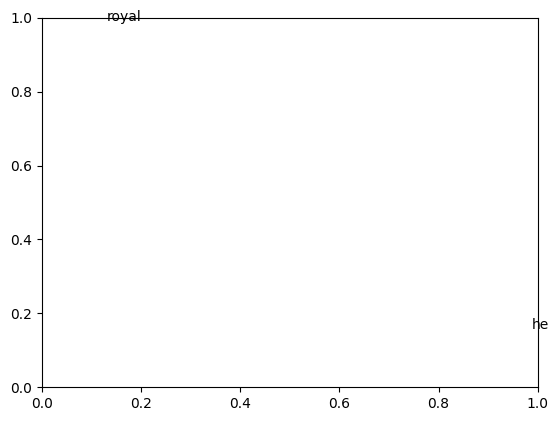

In [162]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
for word in words:
    print(word, vectors[word2int[word]][1])
    ax.annotate(word, (vectors[word2int[word]][0],vectors[word2int[word]][1] ))
plt.show()